In [10]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)


In [15]:
import numpy as np
import pandas as pd
import pickle

import matplotlib.patches as patches
import matplotlib.cm as cm
from scipy import stats
from scipy.spatial import distance

from sklearn.model_selection import LeaveOneOut
from sklearn.ensemble import RandomForestClassifier

from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler

from sklearn.pipeline import make_pipeline

from sklearn.ensemble import RandomForestRegressor

from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import pearsonr, spearmanr
from sklearn.neighbors import LocalOutlierFactor

from mpl_toolkits.axes_grid1 import make_axes_locatable
import pingouin as pg

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_palette('Set2')


# Settings

You don't have to make any changes to "model specs". In "graph specs" you can change which configuration of node and edge features you want to test. These specs will be used to read the corresponding embeddings files.

In [16]:
# model specs
HIDDEN_CHANNELS = 10
EPOCH = 49
MOD = 'CustomGATBOW' 
LR = 0.0005
BATCH_SIZE = 15
TRAINSET = False
N_RUNS = 50
binary = False
anchor_weighted = False
if binary:
    EPOCH = "FINAL"

# graph specs
STIMSET = "SCEGRAM"
CONDITIONS = ['CON', 'SEM', 'SYN', 'EXSYN', 'EXSEMSYN'] # dont change order here, corresponds to order in ratings data
NODES = 'uniform_object_anchor_diag_word2vec'
EDGES = 'uniform_distance_phraseprop_angle_binary' if binary else 'uniform_distance_phraseprop_angle'

In [17]:
configs = {
    # node, edge
    #0: (["uniform"], ["uniform"]),
    1: (["category"], ["uniform"]),
    #2: (["uniform"], ["distance","angle"]),
    #4: (["category"], ["distance","angle"]),
}

archname = "semantic_segmentation"#"alexnet_places"

dnn_layers_alexnet = {
    0: "features.0_activations.npy",
    1: "features.3_activations.npy",
    2: "features.6_activations.npy",
    3: "features.8_activations.npy",
    4: "features.10_activations.npy",
    5: "classifier.4_activations.npy",
    6: "classifier.6_activations.npy",
}
dnn_layers_segmentation = {
    0: "decoder.conv_last.1.npz",
    1: "decoder.fpn_out.2.0.2.npz",
    2: "decoder.ppm_conv.2.2.npz",
    3: "decoder.ppm_conv.3.2.npz",
    4: "decoder.ppm_last_conv.2.npz",
}

if archname == "alexnet_places":
    dnn_layers = dnn_layers_alexnet
elif archname == "semantic_segmentation":
    dnn_layers = dnn_layers_segmentation


# Functions

## Some data loading and pre-processing functions

In [18]:
def load_embed_data(conditions, out_string, trainset, epoch, node=False):
    """
    Parameters
    ----------
    conditions : list
        list of conditions to load embeddings for
    out_string : str
        contains model specs and graph specs
    trainset : bool
        whether embeddings for trainset
    epoch : int
        epoch to load embeddings from
    Returns
    -------
    e : list
        list of embeddings for each condition
    """
    e = []
    for cond in conditions:
        # load embeddings
        if node:
            rep_path = f'../results/node_representations/SCEGRAM_{cond}_{out_string}_trainset{trainset}_epochFINAL_node.json'
        else:
            rep_path = f'../results/graph_representations/SCEGRAM_{cond}_{out_string}_trainset{trainset}_epoch{epoch}_avg.json'
        with open(rep_path, 'rb') as handle:
            embeds = pickle.load(handle)
        e.append(embeds)
    return e

def load_dnn_embeds(dnn_layers, archname):
    """
    Parameters
    ----------
    dnn_layers : dict
        dict of dnn layers and their corresponding file names
    Returns
    -------
    dnn_embeds : dict
        dict of dnn embeddings for each layer
    """
    dnn_embeds = {}
    for layer, fname in dnn_layers.items():
        rep_path = f'/Volumes/Extreme SSD/02_computational_scene_grammar/dnn_representations/{archname}/{fname}'
        embeds = np.load(rep_path)
        if archname=="alexnet_places":
            dnn_embeds[layer] = embeds
        elif archname=="semantic_segmentation":
            # remove file 024_SEM, 048_SEMSYN, 072_EXSEMSYN from embeds
            embeds = {k: v for k, v in embeds.items() if k not in ['074_SEM', '194_SEMSYN', '314_EXSEMSYN']}
            embeds = np.vstack(list(embeds.values()))
            #flatten last 3 dimensions
            embeds = embeds.reshape(embeds.shape[0], -1)
            print(embeds.shape)
            dnn_embeds[layer] = embeds
    return dnn_embeds

def add_imgname(group):
    """
    Parameters
    ----------
    group : pd.DataFrame
        group of consistency ratings
    Returns
    -------
    group : pd.DataFrame
        group of consistency ratings with new column imgname
    """
    group['imgname'] = [
        f"{str(i + 1).zfill(3)}_{val}" for i, val in enumerate(group['consistency_category'])
    ]
    return group

def load_scegram_data(filepath='../SCEGRAM_info.xlsx'):
    """
    Parameters
    ----------
    filepath : str
        path to SCEGRAM_info.xlsx
    Returns
    -------
    df : pd.DataFrame
        consistency ratings with new column imgname
    """
    # load consistency ratings
    df = pd.read_excel(filepath)
    df = df[df['obj_presence'] == 1]
    # create new col "imgname" without .png
    df['imgname'] = df['sce_file_name'].str.replace('.png','')
    # filter presence, remove missing image Scene11_EXSYN 
    df.reset_index(drop=True, inplace=True)
    df.sort_values(by=['consistency_code', 'sce_ID'], inplace=True)
    df = df.groupby('consistency_category', group_keys=False).apply(add_imgname)
    # remove sce_ID 11 and 56 for consistency 
    df = df[df['sce_ID'] != 11] # image not in segmentation report 
    df = df[df['sce_ID'] != 56] # image not in segmentation report
    # remove SEMSYN
    df = df[df['consistency_category'] != 'SEMSYN']
    df.reset_index(inplace=True)

    sce_ids_to_drop = [12] # skip sce_ID 12 only two objects no edge
    
    # Drop rows from df where both the consistency_category and sce_ID match
    df = df[~(df['sce_ID'].isin(sce_ids_to_drop))]

    return df

def load_scegram_data_rep():
    df = pd.read_csv('/Volumes/Extreme SSD/Langmark_Deploy_08_Aug_2024_19_01_27/langmarkTab_deploy.csv')
    
    # filter sceneId starting with s
    df = df[df['sceneId'].str.startswith('s')]

    # create new col sce_ID without the sScene part
    df['sce_ID'] = df['sceneId'].str[6:].astype(int)
    
    # sort by sce_ID
    df.sort_values(by='sce_ID', inplace=True)
    
    # select columns sce_ID, meanRatingConConsistencyALL, meanRatingSemConsistencyALL
    df = df[['sce_ID', 'meanRatingConConsistencyALL', 'meanRatingSemConsistencyALL']]

    # remove sce_ID 11 and 56
    df = df[df['sce_ID'] != 11] # image not in segmentation report
    df = df[df['sce_ID'] != 56] # image not in segmentation report
    df.reset_index(drop=True, inplace=True)
    return df


## Modelling functions

In [19]:
#----MODEL FUNCTIONS----#
def filter_ratings(df, consistency):
    """
    Parameters
    ----------
    df : pd.DataFrame
        consistency ratings
    consistency : str
        consistency category
    Returns
    -------
    df : pd.DataFrame
        consistency ratings for specific category
    """
    df = df[df['consistency_category'] == consistency]
    return df

def load_embed_data(conditions, out_string, trainset, epoch, node=False, remove_outliers=False):
    """
    Parameters
    ----------
    conditions : list
        list of conditions to load embeddings for
    out_string : str
        contains model specs and graph specs
    trainset : bool
        whether embeddings for trainset
    epoch : int
        epoch to load embeddings from
    Returns
    -------
    e : list
        list of embeddings for each condition
    """
    e = []
    outliers = []
    for cond in conditions:
        # load embeddings
        if node:
            rep_path = f'../results/node_representations/SCEGRAM_{cond}_{out_string}_trainset{trainset}_epochFINAL_node.json'
        else:
            rep_path = f'../results/graph_representations/SCEGRAM_{cond}_{out_string}_trainset{trainset}_epoch{epoch}_avg.json'
        with open(rep_path, 'rb') as handle:
            embeds = pickle.load(handle)
        
        # preprocess embeddings
        embeds, _ = preproc_embeds(embeds, remove_outliers=remove_outliers)
        e.append(embeds)
        outliers.append(_)
    
    # unroll embeds
    e = np.vstack(e)
    return e, outliers

def preproc_embeds(embeds, remove_outliers=False):
    try:
        embeds = [x.detach().numpy() for x in embeds]
    except AttributeError:
        pass
    embeds = np.array(embeds)
    # reshape to 2D, shape (n_images, n_features)
    embeds = embeds.reshape(embeds.shape[0], -1)
    if remove_outliers:
        outliers = find_outlier(embeds, type="lof")
        embeds = np.delete(embeds, outliers, axis=0)
        return embeds, outliers
    else:
        return embeds, None
    
def find_outlier(data, type="maha"):
    if type=="maha":
        mean = np.mean(data, axis=0)
        cov_matrix = np.cov(data, rowvar=False)

        # Calculate the Mahalanobis distance for each observation
        mahalanobis_distances = [distance.mahalanobis(sample, mean, np.linalg.inv(cov_matrix)) for sample in data]

        # Set a threshold for identifying outliers
        threshold = 3  # Typical threshold (can be adjusted)
        outliers = np.where(np.array(mahalanobis_distances) > threshold)[0]

    elif type=="lof":
        lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)  # Contamination is the expected outlier proportion
        outliers = lof.fit_predict(data)
        outliers = np.where(outliers == -1)[0]

    print("Outliers detected at indices:", outliers)
    return outliers


def get_good_dims(out_string, node, remove_outliers, con_sem_diff_ratings, con_syn_diff_ratings, con_exsyn_diff_ratings, con_exsemsyn_diff_ratings, type="corr", abs_diff=False):
    con_embeds, outliers = load_embed_data(["CON"], out_string, TRAINSET, EPOCH, node=node, remove_outliers=remove_outliers)
    sem_embeds, outliers = load_embed_data(["SEM"], out_string, TRAINSET, EPOCH, node=node, remove_outliers=remove_outliers)
    syn_embeds, outliers = load_embed_data(["SYN"], out_string, TRAINSET, EPOCH, node=node, remove_outliers=remove_outliers)
    exsyn_embeds, outliers = load_embed_data(["EXSYN"], out_string, TRAINSET, EPOCH, node=node, remove_outliers=remove_outliers)
    exsemsyn_embeds, outliers = load_embed_data(["EXSEMSYN"], out_string, TRAINSET, EPOCH, node=node, remove_outliers=remove_outliers)

    con_sem_diff = sem_embeds - con_embeds
    con_syn_diff = syn_embeds - con_embeds
    con_exsyn_diff = exsyn_embeds - con_embeds
    con_exsemsyn_diff = exsemsyn_embeds - con_embeds
    
    if abs:
        con_sem_diff = abs(con_sem_diff)
        con_syn_diff = abs(con_syn_diff)
        con_exsyn_diff = abs(con_exsyn_diff)
        con_exsemsyn_diff = abs(con_exsemsyn_diff)
        
    if type=="corr":
        good_indices = []
        # Calculate the spearmanr correlation between the differences and the ratings
        con_sem_corrs = [spearmanr(diff, con_sem_diff_ratings)[0] for diff in con_sem_diff.T]
        good_indices.append(np.where(np.array(con_sem_corrs) > 0.15)[0])
        print(con_sem_corrs)
        
        con_syn_corrs = [spearmanr(diff, con_syn_diff_ratings)[0] for diff in con_syn_diff.T]
        good_indices.append(np.where(np.array(con_syn_corrs) > 0.15)[0])
        print(con_syn_corrs)

        con_exsyn_corrs = [spearmanr(diff, con_exsyn_diff_ratings)[0] for diff in con_exsyn_diff.T]
        good_indices.append(np.where(np.array(con_exsyn_corrs) > 0.15)[0])
        print(con_exsyn_corrs)

        con_exsemsyn_corrs = [spearmanr(diff, con_exsemsyn_diff_ratings)[0] for diff in con_exsemsyn_diff.T]
        good_indices.append(list(np.where(np.array(con_exsemsyn_corrs) > 0.15)[0]))
        print(con_exsemsyn_corrs)
        # unpack good indices to list 
        good_indices = [idx for sublist in good_indices for idx in sublist]

        return np.unique(good_indices)
    
    elif type=="pca":   
        pca = PCA(n_components=1)
        con_sem_diff_pca = pca.fit_transform(con_sem_diff)
        con_syn_diff_pca = pca.fit_transform(con_syn_diff)
        con_exsyn_diff_pca = pca.fit_transform(con_exsyn_diff)
        con_exsemsyn_diff_pca = pca.fit_transform(con_exsemsyn_diff)
        new_embeds = np.hstack([con_sem_diff_pca, con_syn_diff_pca, con_exsyn_diff_pca, con_exsemsyn_diff_pca])       
        return new_embeds
    
def get_ratings_diff(abs_diff=True):
    df = load_scegram_data()
    con_ratings = filter_ratings(df, "CON")["consistency_rating"].values
    sem_ratings = filter_ratings(df, "SEM")["consistency_rating"].values
    syn_ratings = filter_ratings(df, "SYN")["consistency_rating"].values
    exsyn_ratings = filter_ratings(df, "EXSYN")["consistency_rating"].values
    exsemsyn_ratings = filter_ratings(df, "EXSEMSYN")["consistency_rating"].values

    con_sem_diff_ratings = sem_ratings.reshape(-1) - con_ratings.reshape(-1)  
    con_syn_diff_ratings = syn_ratings.reshape(-1) - con_ratings.reshape(-1)
    con_exsyn_diff_ratings = exsyn_ratings.reshape(-1) - con_ratings.reshape(-1)
    con_exsemsyn_diff_ratings = exsemsyn_ratings.reshape(-1) - con_ratings.reshape(-1)
    if abs:
        con_sem_diff_ratings = np.abs(con_sem_diff_ratings)
        con_syn_diff_ratings = np.abs(con_syn_diff_ratings)
        con_exsyn_diff_ratings = np.abs(con_exsyn_diff_ratings)
        con_exsemsyn_diff_ratings = np.abs(con_exsemsyn_diff_ratings)
    return con_sem_diff_ratings, con_syn_diff_ratings, con_exsyn_diff_ratings, con_exsemsyn_diff_ratings

def remove_outliers_from_df(df, CONDITIONS, outliers):
    rows_to_drop = []
    for group_name, indices in zip(CONDITIONS, outliers):
        # Filter the DataFrame to the current group
        group_df = df[df['consistency_category'] == group_name]
        
        # Get the actual indices in the original DataFrame based on the relative indices
        group_indices = group_df.index[indices]
        
        # Extend the list of rows to drop
        rows_to_drop.extend(group_indices)

    # Remove rows from DataFrame based on calculated indices
    df_cleaned = df.drop(rows_to_drop)
    return df_cleaned

def preproc_dnn_embeds(embeds):
    # PCA down to 10 components
    pca = PCA(n_components=10)
    embeds_pca = {}
    for layer, embed in embeds.items():
        embeds_pca[layer] = pca.fit_transform(embed)
    return embeds_pca

def run_model(c, embeds, df, filter=False, condition=None, y_col='consistency_rating', condition_col='consistency_category', scale_y=False, oversample=None):
    random_state = 42
    # Get ratings (target) and conditions
    df = filter_ratings(df, condition) if filter else df
    y = df[y_col].values
    if scale_y:
        # Min-Max scaling to [0, 1]
        scaler = MinMaxScaler()
        y = scaler.fit_transform(y.reshape(-1, 1))
        y = y.ravel()

    conditions = df[condition_col].values
    img_ids = df['imgname'].values

    print(y.shape, embeds.shape)
    # shuffle embeddings
    embeddings_shuffled, y_shuffled, conditions_shuffled, img_ids_shuffled = shuffle(embeds, y, conditions, img_ids, random_state=random_state)

    # Initialize the LOOCV object
    loo = LeaveOneOut()

    # Initialize lists to store predictions and actual values
    y_pred_list = []
    y_actual_list = []
    conditions_list = []
    img_id_list = []

    # Loop over each training/testing split
    split = 0
    for train_index, test_index in loo.split(embeddings_shuffled):
        split += 1
        # Split the data into training and testing sets
        X_train, X_test = embeddings_shuffled[train_index], embeddings_shuffled[test_index]
        y_train, y_test = y_shuffled[train_index], y_shuffled[test_index]
        condition_test = conditions_shuffled[test_index]
        img_id_test = img_ids_shuffled[test_index]

        # Oversample only on the training data
        if oversample=="Gaussian":
            # Define a threshold for low-end ratings (e.g., ratings <= 2)
            threshold = 2

            # Identify the indices of samples in the training set where the target value is <= the threshold
            low_rating_indices_train = np.where(y_train <= threshold)[0]

            # Resample the low ratings with replacement within the training set and add small noise
            n_samples_to_add = 200  # Define how many additional samples you'd like to generate
            resampled_indices_train = np.random.choice(low_rating_indices_train, size=n_samples_to_add, replace=True)
            # add noise
            X_train_oversample = X_train[resampled_indices_train] + np.random.normal(0, 0.01, X_train[resampled_indices_train].shape)

            # Resample the corresponding features and target values in the training set
            X_train = np.vstack([X_train, X_train_oversample])  # Append resampled feature rows to original X_train
            y_train = np.hstack([y_train, y_train[resampled_indices_train]])  # Append resampled target values to y_train
        
        # Shuffle the training data (optional, but useful for randomizing batches)
        X_train, y_train = shuffle(X_train, y_train, random_state=random_state)
        
        # plot distribution of ratings for one exemplary split
        if split == 1:
            sns.histplot(y_train, bins=20, kde=True)

        # Create a pipeline with standardization and regression
        model = make_pipeline(
            StandardScaler(),  # Standardize features
            c                 # regressor
        )

        # Fit the model on the training data
        model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = model.predict(X_test)

        # Store the actual and predicted values, and the condition
        y_pred_list.append(y_pred[0])
        y_actual_list.append(y_test[0])
        conditions_list.append(condition_test[0])
        img_id_list.append(img_id_test[0])

    # Return actual vs predicted ratings and their conditions for further plotting
    return np.array(y_pred_list), np.array(y_actual_list), np.array(conditions_list), np.array(img_id_list)


## Plotting functions

In [20]:
def get_bayes_factor_color(bf, max_bf, threshold=10):
    cmap = cm.get_cmap('Reds')
    if bf > threshold:
        # Normalize for BF10 greater than 10
        normalized_bf = min((np.log10(bf) - np.log10(threshold)) / (np.log10(max_bf) - np.log10(threshold)), 1)
        return cmap(normalized_bf)
    else:
        # Fixed light red for BF10 less than or equal to 10
        return cmap(0.1)  # Light red (lower end of the Reds scale)
    
def add_plot_settings():
    # Despine the plot (removes top and right spines)
    sns.despine()

    # Increase the size of the tick labels
    plt.xticks(fontsize=20)  # Increase x-axis tick label size
    plt.yticks(fontsize=20)  # Increase y-axis tick label size
    plt.xlabel('')
    plt.ylabel('')

def plot_accuracy_per_condition(df_avg, bfs, conditions_order=CONDITIONS, x='Condition', y='Accuracy', chance=1/6, ylim=(0, 0.7), connect_means=True,
                                palette='Set2', stripplot=False):
        plt.figure(figsize=(10, 6))
        cmap = cm.get_cmap('Reds')
        
        if bfs is not None:
            # Add a log transformation to the Bayes Factors for better scaling in the plot
            log_bayes_factors = {k: np.log10(float(v)) for k, v in bfs.items()} 

            # Normalize BF10 values for visualizing colors on the "Reds" scale
            bf_values = [bfs[condition] for condition in conditions_order]
            print(bf_values)
            max_bf = max(bf_values)

        # Barplot
        sns.barplot(x=x, y=y, data=df_avg, order=conditions_order, palette=palette, errcolor='black', errwidth=2, capsize=0.1, zorder=1)
        if stripplot:
            sns.stripplot(x=x, y=y, data=df_avg, order=conditions_order, 
                          color='grey', alpha=0.2, jitter=False, zorder=2)
            
        # Calculate the mean and confidence interval for each condition
        means = df_avg.groupby(x)[y].mean().reindex(conditions_order)

        # Overlay the mean and confidence interval as red diamonds and error bars
        mean_positions = []
        
        for i, (mean, condition) in enumerate(zip(means, conditions_order)):            
            mean_positions.append(i)  # Store x positions for line plotting
            
            # Get the color based on Bayes factor
            if bfs is not None:
                color = get_bayes_factor_color(bfs[condition], max_bf)
            
                # Add a filled square at y position 0.65 with color based on BF
                square = patches.Rectangle((i - 0.1, ylim[1]-0.1), 0.2, 0.02, color=color, alpha=0.8)
                plt.gca().add_patch(square)
            
                # Optionally, add the BF value as text above the square
                bf_text = f"BF=\n{bfs[condition]:.1e}" if bfs[condition] > 1000 else f"BF={bfs[condition]:.1f}"
                plt.text(i, ylim[1]-0.05, f'{bf_text}', ha='center', fontsize=18, color='black')

        # Plot black lines connecting the means
        if connect_means:
            plt.plot(mean_positions, means, color='black', linestyle='-', linewidth=2)

        plt.grid(False)
        #plt.title(f'Accuracy per Condition - Node: {node_features}, Edge: {edge_features}')
        plt.xlabel(x)
        plt.ylabel(y)
        plt.ylim(ylim)
        plt.xlim(-0.5, len(conditions_order) - 0.5)
        plt.axhline(y=chance, color='r', linestyle='--')
        plt.xticks()  # Rotate the x-axis labels if needed
        plt.tight_layout()  # Adjust layout to prevent overlap
        add_plot_settings()
        plt.show()
            
def plot_rdm(embeds, node, edge, condition, vmax=0.2):
    # plot representational dissimilarity matrix (pearson correlation)

    fig, ax = plt.subplots(figsize=(10, 10))
    rdm = 1 - np.corrcoef(embeds)

    # Plot the RDM
    im = ax.imshow(rdm, cmap='viridis', vmin=0, vmax=vmax)

    # Create an axes on the right side of the ax for the colorbar, with proper size
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)  # Adjust size and pad as needed

    # Add the colorbar and align its size
    plt.colorbar(im, cax=cax)

    # Set the title
    ax.set_title(f'RDM {node} {edge} {condition}')

    # Show the plot
    plt.show()

#----PLOTTING FUNCTIONS----#
def plot_predicted_vs_actual(config, y_pred, y_actual, conditions, conditions_order=CONDITIONS):
    correlation_coef, p_value = pearsonr(y_actual, y_pred)
    plt.figure(figsize=(10, 6))
    ax = sns.scatterplot(x=y_actual, y=y_pred, hue=conditions, palette="Set2", s=100, hue_order=conditions_order)
    # Add correlation coefficient to the plot
    ax.annotate(f'r = {correlation_coef:.2f}', xy=(0.05, 0.95), xycoords='axes fraction',
                fontsize=20, ha='left', va='top', bbox=dict(boxstyle="round,pad=0.3", edgecolor="white", facecolor="white"))

    plt.plot([min(y_actual), max(y_actual)], [min(y_actual), max(y_actual)], 'r--', lw=2)  # Diagonal line for reference
    plt.title(f'{config}: Predicted vs Actual Consistency Ratings by Consistency Condition')
    add_plot_settings()
    # remove legends
    plt.legend([],[], frameon=False)
    plt.show()

def plot_boxplot_predicted(config, predicted_ratings, conditions, conditions_order=CONDITIONS):
    # Create a DataFrame with predicted ratings and their corresponding conditions
    df_predicted = pd.DataFrame({
        'Predicted Rating': predicted_ratings,
        'Consistency Condition': conditions
    })

    # Plot the boxplot for predicted ratings
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Consistency Condition', y='Predicted Rating', data=df_predicted, order=conditions_order)
    plt.title(f'{config}: Predicted Consistency Ratings by Consistency Condition')
    plt.xlabel('Consistency Condition')
    plt.ylabel('Predicted Rating')
    plt.show()

def plot_avg_predicted_ratings(df, conditions_order=CONDITIONS, dnn=False, y_label="Average Predicted Rating", title_prefix="Average Predicted Ratings by Consistency Condition", 
    figsize = (10, 6)):
    # Group the dataframe by the necessary columns
    group_cols = ['Consistency Condition', 'Layer', 'Img_ID'] if dnn else ['Consistency Condition', 'Node Features', 'Edge Features', 'Img_ID', 'representation_level','graph_type']
    df_avg = df.groupby(group_cols)['Predicted Rating'].mean().reset_index()

    # Get unique combinations of DNN layers or node/edge features
    unique_cols = ['Layer'] if dnn else ['Node Features', 'Edge Features', 'representation_level', 'graph_type']
    unique_combinations = df_avg[unique_cols].drop_duplicates()

    # Loop through each unique combination and create a boxplot
    for _, row in unique_combinations.iterrows():
        if dnn:
            filter_condition = df_avg['Layer'] == row['Layer']
            plot_title = f"{title_prefix} - Layer: {row['Layer']}"
        else:
            filter_condition = (df_avg['Node Features'] == row['Node Features']) & (df_avg['Edge Features'] == row['Edge Features']) & (df_avg['representation_level'] == row['representation_level']) & (df_avg['graph_type'] == row['graph_type'])
            plot_title = f"{title_prefix} - Node: {row['Node Features']}, Edge: {row['Edge Features']}"

        # Filter the data for this combination
        df_combination = df_avg[filter_condition]

        # Create the plot
        plt.figure(figsize=figsize)
        sns.boxplot(x='Consistency Condition', y='Predicted Rating', data=df_combination, order=conditions_order)
        # Overlay the individual data points using stripplot
        sns.stripplot(x='Consistency Condition', y='Predicted Rating', data=df_combination, order=conditions_order,
                    color='black', alpha=0.5, jitter=True, zorder=2)

        # Calculate the mean for each consistency category
        means = df_combination.groupby('Consistency Condition')['Predicted Rating'].mean()

        # Overlay the mean as a red big diamond using the correct category positions
        for i, mean in enumerate(means):
            plt.scatter(x=means.index[i], y=mean, color='red', marker="D", s=100, label='Mean' if i == 0 else "", zorder=3)
            
        add_plot_settings()
        plt.title(plot_title)

        plt.ylim(1, 6)
        plt.show()

def compute_correlations(df):
    # Group by 'Run' and 'Configuration', then compute correlation
    correlation_data = df.groupby(['Run', 'Configuration']).apply(
        lambda x: x['Predicted Rating'].corr(x['Actual Rating'], method='spearman')
    ).reset_index(name='Correlation')
    return correlation_data

def plot_prediction_accuracy(df, bfs,figsize):
    cmap = cm.get_cmap('Reds')
    # Calculate the mean for each configuration 
    means = df.groupby('Configuration')['Correlation'].mean()

    # Sort the configurations by the mean, from highest to lowest
    sorted_configurations = means.sort_values(ascending=False).index
    sorted_configurations_gnn = sorted_configurations[:4]

    # Generate a color palette from dark orange to light orange
    colors = sns.color_palette("Oranges", n_colors=len(sorted_configurations), desat=0.8)[::-1]

    # Create a boxplot with the correlations
    plt.figure(figsize=figsize)
    # Normalize BF10 values for visualizing colors on the "Reds" scale
    bf_values = [bfs[config] for config in sorted_configurations_gnn]
    max_bf = max(bf_values)
    
    # Barplot
    sns.barplot(x='Configuration', y='Correlation', data=df, order=sorted_configurations, palette=colors, errcolor='black', errwidth=2, capsize=0.1, zorder=1)

    sns.stripplot(x='Configuration', y='Correlation', data=df,
            color='grey', alpha=0.2, jitter=False, zorder=2, order=sorted_configurations)

    for i, config in enumerate(sorted_configurations_gnn):
        mean = means[config]
        # Get the color based on Bayes factor
        color = get_bayes_factor_color(bfs[config], max_bf)
        
        # Add a filled square at y position 0.65 with color based on BF
        square = patches.Rectangle((i - 0.1, 0.75), 0.2, 0.02, color=color, alpha=0.8)
        plt.gca().add_patch(square)
        
        # Optionally, add the BF value as text above the square
        bf_text = f"BF=\n{bfs[config]:.1e}" if bfs[config] > 1000 else f"BF={bfs[config]:.1f}"
        plt.text(i, 0.8, f'{bf_text}', ha='center', fontsize=18, color='black')

    plt.axhline(y=0, color='r', linestyle='--')#
    plt.xticks(rotation=45)
    add_plot_settings()
    plt.xticks(fontsize=10)
    plt.ylim(-0.75, 1)
    plt.xlim(-0.5, len(sorted_configurations) - 0.5)
    plt.show()

# Load scegram ratings 

Here, we load the original scegram consistency ratings (from the original paper)


In [21]:
df = load_scegram_data()

Scene categories

In [22]:
# unique sce_categories
unique_categories = df['sce_category'].unique()
n_sce_cats = len(unique_categories)
print(f'{n_sce_cats} unique categories: {unique_categories}')

6 unique categories: ['KITCHEN' 'BATHROOM' 'CORRIDOR' 'LIVING_ROOM' 'BEDROOM' 'OFFICE']


# Modelling

variables

- node feats, edge feats
- consistency category
- scene category
- consistency ratings


# RDMs

(295, 10)


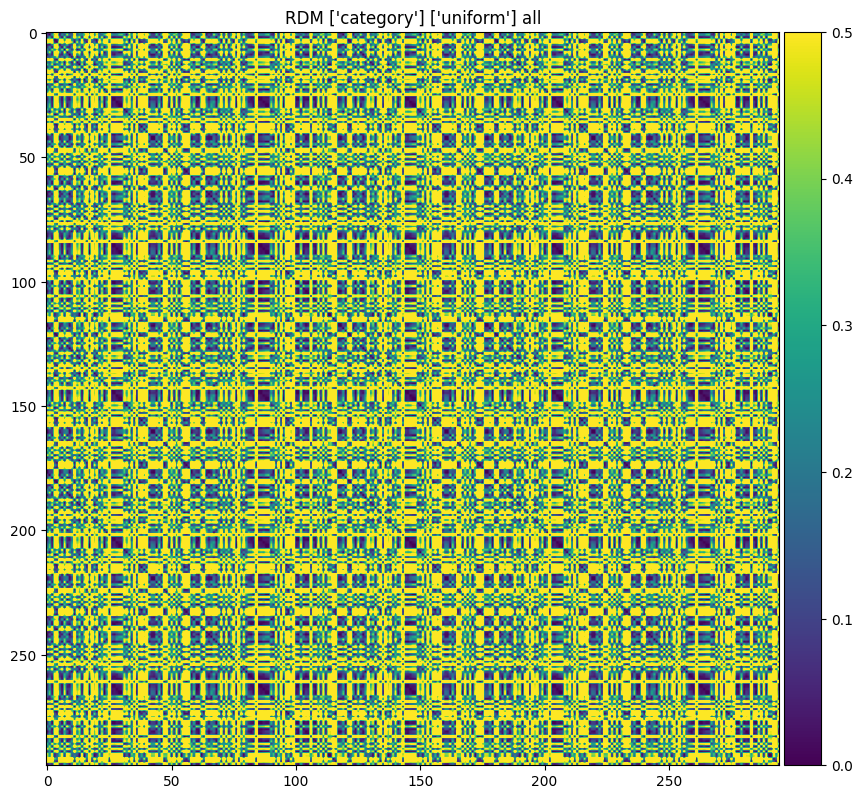

In [25]:
EPOCH = "FINAL"

binary = False
anchor_weighted = False

seperate = False
node_rep = False

for i, (node, edge) in configs.items():
    node_string = '_'.join(node)
    edge_string = '_'.join(edge)
    out_string = f'h{HIDDEN_CHANNELS}_mod{MOD}_lr{LR}_bs{BATCH_SIZE}_stimsetADEK20K_edge-{edge_string}_node-{node_string}_binary-{binary}_weighted-{anchor_weighted}_0'
    if seperate:
        for con in ["SEM"]:
            embeds, _ = load_embed_data([con], out_string, TRAINSET, EPOCH, node=node_rep)
            print(embeds.shape)
            plot_rdm(embeds, node, edge, con)
    else:
        embeds, _ = load_embed_data(CONDITIONS, out_string, TRAINSET, EPOCH, node=node_rep)
        print(embeds.shape)
        plot_rdm(embeds, node, edge, 'all', vmax=0.5)

Embedding differences between conditions

node: category, edge: uniform


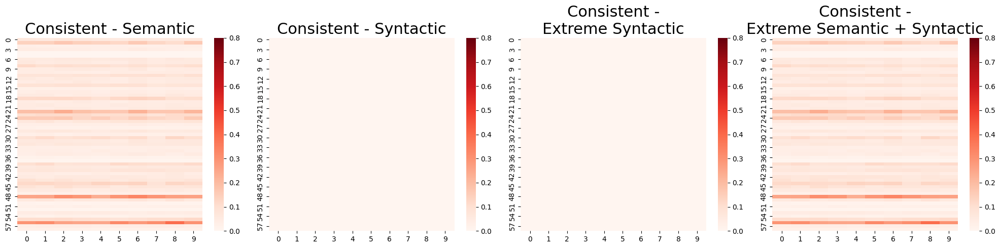

In [30]:
EPOCH = "FINAL"
node_rep = False

binary = False
anchor_weighted = False

avg = False
remove_outliers = False

N_RUNS = 50

abs_diff = True

configs = {
    # node, edge
    #0: (["uniform"], ["uniform"]),
    1: (["category"], ["uniform"]),
    #2: (["uniform"], ["distance","angle"]),
    #4: (["category"], ["distance","angle"]),
}

for i, (node, edge) in configs.items():
    node_string = '_'.join(node)
    edge_string = '_'.join(edge)
    #node_string = 'category'
    #edge_string = 'distance_angle'

    differences_all = np.zeros((N_RUNS, 4, 59, 10))
    for run in range(N_RUNS):
        out_string = f'h{HIDDEN_CHANNELS}_mod{MOD}_lr{LR}_bs{BATCH_SIZE}_stimsetADEK20K_edge-{edge_string}_node-{node_string}_binary-{binary}_weighted-{anchor_weighted}_{run}'
        
        con_embeds, outliers = load_embed_data(["CON"], out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)
        sem_embeds, outliers = load_embed_data(["SEM"], out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)
        syn_embeds, outliers = load_embed_data(["SYN"], out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)
        exsyn_embeds, outliers = load_embed_data(["EXSYN"], out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)
        exsemsyn_embeds, outliers = load_embed_data(["EXSEMSYN"], out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)

        if avg:
            con_embeds = np.mean(con_embeds, axis=1).reshape(-1, 1)
            sem_embeds = np.mean(sem_embeds, axis=1).reshape(-1, 1)
            syn_embeds = np.mean(syn_embeds, axis=1).reshape(-1, 1)
            exsyn_embeds = np.mean(exsyn_embeds, axis=1).reshape(-1, 1)
            exsemsyn_embeds = np.mean(exsemsyn_embeds, axis=1).reshape(-1, 1)

        con_sem_diff = sem_embeds - con_embeds
        con_syn_diff = syn_embeds - con_embeds
        con_exsyn_diff = exsyn_embeds - con_embeds
        con_exsemsyn_diff = exsemsyn_embeds - con_embeds
        
        if abs_diff:
            con_sem_diff = np.abs(con_sem_diff)
            con_syn_diff = np.abs(con_syn_diff)
            con_exsyn_diff = np.abs(con_exsyn_diff)
            con_exsemsyn_diff = np.abs(con_exsemsyn_diff)

        differences_all[run, 0, :, :] = con_sem_diff
        differences_all[run, 1, :, :] = con_syn_diff
        differences_all[run, 2, :, :] = con_exsyn_diff
        differences_all[run, 3, :, :] = con_exsemsyn_diff

    # average difference over runs
    
    # Create a figure with subplots in one row and four columns
    titles = ['Consistent - Semantic', 'Consistent - Syntactic', 'Consistent -\nExtreme Syntactic', 'Consistent -\nExtreme Semantic + Syntactic']
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1 row, 4 columns

    # Loop over the differences and plot them
    for i in range(4):
        ax = axes[i]  # Access the axes in one row
        sns.heatmap(differences_all[:, i, :, :].mean(axis=0), cmap='Reds', ax=ax, cbar=True, vmin=0, vmax=0.8)
        ax.set_title(titles[i],fontsize=22)

    # Adjust layout for better appearance
    plt.tight_layout()
    
    # Print additional information if necessary
    print(f'node: {node_string}, edge: {edge_string}')

    # Show the plots
    plt.show()

In [ ]:
# ratings difference 

con_sem_diff_ratings, con_syn_diff_ratings, con_exsyn_diff_ratings, con_exsemsyn_diff_ratings = get_ratings_diff(abs_diff=True)


In [ ]:
# plot mean differences ratings
ratings_differences = [con_sem_diff_ratings, con_syn_diff_ratings, con_exsyn_diff_ratings, con_exsemsyn_diff_ratings]
titles = ['Consistent - Semantic', 'Consistent - Syntactic', 'Consistent -\nExtreme Syntactic', 'Consistent -\nExtreme Semantic + Syntactic']

# Create a figure for the heatmap
fig, axes = plt.subplots(1, 4, figsize=(10, 4), sharey=True)  # Use 1 row, 4 columns to match titles

for i, diff in enumerate(ratings_differences):
    # Reshape the difference array into a 2D array with one column
    diff_reshaped = diff[:, np.newaxis]
    
    # Create the heatmap for this rating difference
    sns.heatmap(diff_reshaped, cmap='Reds', ax=axes[i], cbar=True, annot=False, yticklabels=False, vmin=0, vmax=5)
    
    # Set the title for each subplot
    axes[i].set_title(titles[i])
    
    # Hide x-axis as we are only interested in the y-axis
    axes[i].set_xticks([])

# Adjust layout for better visibility
plt.tight_layout()
plt.show()

DNN embeddings

In [ ]:
# plot dnn embed RDMs
dnn_embeds = load_dnn_embeds(dnn_layers, archname)
dnn_embeds = preproc_dnn_embeds(dnn_embeds)
for layer, embed in dnn_embeds.items():
    embed = embed[:60]
    plot_rdm(embed, "DNN", f"layer_{layer}", "CON")

# Scene classification

## Run GNN

(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59, 10)
(59,) (59,

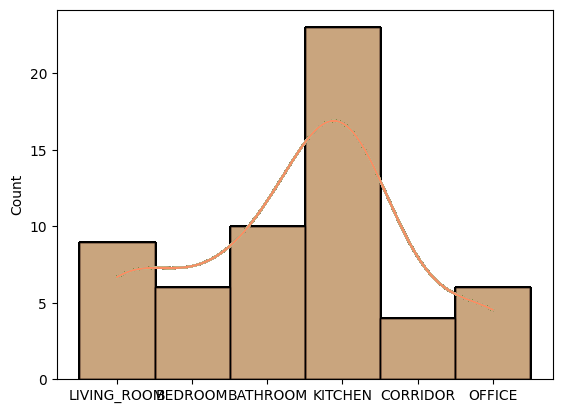

In [31]:
res_all = []
N_RUNS = 50
node_rep = False

binary = False
anchor_weighted = False
combined = False
EPOCH = "FINAL"
remove_outliers = False

for run in range(N_RUNS):
    for i, (node, edge) in configs.items():
        df = load_scegram_data().reset_index()
        node_string = '_'.join(node)
        edge_string = '_'.join(edge)

        out_string = f'h{HIDDEN_CHANNELS}_mod{MOD}_lr{LR}_bs{BATCH_SIZE}_stimsetADEK20K_edge-{edge_string}_node-{node_string}_binary-{binary}_weighted-{anchor_weighted}_{run}'

        # Initialize lists to store accuracy and report
        y_pred = []
        y_actual = []
        conditions = []
        img_ids = []

        # Loop through each condition and run the classification
        for condition in CONDITIONS:
            embeds, outliers = load_embed_data([condition], out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)
            y_pred_list, y_actual_list, conditions_list, img_id_list = run_model(RandomForestClassifier(max_depth=20, min_samples_leaf=4, n_estimators=200), embeds, df, filter=True, condition=condition, y_col='sce_category', condition_col='consistency_category')
            y_pred.extend(y_pred_list)
            y_actual.extend(y_actual_list)
            conditions.extend(conditions_list)
            img_ids.extend(img_id_list)

        # Save results to a DataFrame
        results = pd.DataFrame({
            'Run': [run] * len(y_pred),
            'Condition': conditions,
            'Img_Id': img_ids,
            'Predicted Rating': y_pred,
            'Actual Rating': y_actual,
            'Accuracy': [1 if pred == actual else 0 for pred, actual in zip(y_pred, y_actual)],
            'Node Features': node_string,
            'Edge Features': edge_string
        })
        res_all.append(results)
res_df = pd.concat(res_all)


In [32]:
# save to csv
if MOD == "CustomGATBOW":
    configs_string = f'BOW_node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}'
else:
    configs_string = f'node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}'
print(configs_string)

BOW_node-False_binary-False_weighted-False_removeoutliers-False


In [33]:
res_df.to_csv(f'../results/classification_results/SCEGRAM_randomforest_classification_results_runs-{N_RUNS}_{configs_string}.csv', index=False)

In [34]:
# combine configs
N_RUNS = 50
node_rep = False
binary = False
anchor_weighted = False
remove_outliers = False
configs_string = f'node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}'

res_df_1 = pd.read_csv(f'../results/classification_results/SCEGRAM_randomforest_classification_results_runs-{N_RUNS}_{configs_string}.csv')
res_df_1["representation_level"] = "graph"
res_df_1["graph_type"] = "complete"

configs_string = f'BOW_node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}'
res_df_2 = pd.read_csv(f'../results/classification_results/SCEGRAM_randomforest_classification_results_runs-{N_RUNS}_{configs_string}.csv')
res_df_2["representation_level"] = "graph"
res_df_2["graph_type"] = "completeBOW"

binary = True
configs_string = f'node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}'
res_df_3 = pd.read_csv(f'../results/classification_results/SCEGRAM_randomforest_classification_results_runs-{N_RUNS}_{configs_string}.csv')
res_df_3["representation_level"] = "graph"
res_df_3["graph_type"] = "binary"

res_df = pd.concat([res_df_1, res_df_2, res_df_3])
res_df.to_csv(f'../results/classification_results/SCEGRAM_randomforest_classification_results_runs-{N_RUNS}_all.csv', index=False) 

### Stats and Plot

In [35]:
# load all results
N_RUNS = 50

res_df_all = pd.read_csv(f'../results/classification_results/SCEGRAM_randomforest_classification_results_runs-{N_RUNS}_all.csv')

# Bayesian ttest
chance_level = 1/6

# filter config
graph_type = "completeBOW"
node_feat = "category"
edge_feat = "uniform"

df = res_df_all[(res_df_all['Node Features'] == node_feat) & (res_df_all['Edge Features'] == edge_feat) & 
                (res_df_all['graph_type'] == graph_type)]
# average over runs
df_avg = df.groupby(['Condition', 'Run'])['Accuracy'].mean().reset_index()

results = []
for condition in df_avg['Condition'].unique():
    accuracy_data = df_avg[df_avg['Condition'] == condition]['Accuracy'].values
    # remove chance level from accuracy
    diff = accuracy_data - chance_level

    # compute 95% confidence interval
    deg = len(accuracy_data) - 1
    confidence_level = 0.95
    alpha = 1 - confidence_level
    critical_t = stats.t.ppf(1 - alpha/2, deg)
    std_err = np.std(accuracy_data, ddof=1) / np.sqrt(len(accuracy_data))
    confidence_interval = critical_t * std_err
    ci_lower = np.mean(accuracy_data) - confidence_interval
    ci_upper = np.mean(accuracy_data) + confidence_interval
  
    # Perform Bayesian t-test
    b_stats = pg.ttest(x=diff, y=0, alternative='greater', confidence=0.95)
    b_stats['Condition'] = condition
    b_stats['CI_lower'] = ci_lower
    b_stats['CI_upper'] = ci_upper
    b_stats['mean'] = np.mean(accuracy_data)

    results.append(b_stats)

# Combine all results into a single DataFrame for easier viewing
bayes_results_df = pd.concat(results).reset_index(drop=True)
bf_dict = dict(zip(bayes_results_df["Condition"], bayes_results_df["BF10"]))
bf_dict = {condition: float(bf_dict[condition]) for condition in CONDITIONS}
bayes_results_df

/Users/aylinkallmayer/anaconda3/envs/csg/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: divide by zero encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/aylinkallmayer/anaconda3/envs/csg/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: divide by zero encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/aylinkallmayer/anaconda3/envs/csg/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: divide by zero encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/aylinkallmayer/anaconda3/envs/csg/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: divide by zero encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/aylinkallmayer/anaconda3/envs/csg/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: divide by zero encounte

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power,Condition,CI_lower,CI_upper,mean
0,37.783896,49,greater,3.336815e-38,"[0.27, inf]",5.343450,5.321e+34,1.0,CON,0.433486,0.463463,0.448475
1,34.904113,49,greater,1.416118e-36,"[0.22, inf]",4.936187,1.361e+33,1.0,EXSEMSYN,0.384010,0.410566,0.397288
2,36.870481,49,greater,1.063533e-37,"[0.27, inf]",5.214273,1.712e+34,1.0,EXSYN,0.429589,0.459902,0.444746
3,34.276178,49,greater,3.330600e-36,"[0.22, inf]",4.847384,5.897e+32,1.0,SEM,0.386958,0.414398,0.400678
4,36.258614,49,greater,2.347031e-37,"[0.27, inf]",5.127742,7.894e+33,1.0,SYN,0.429974,0.460873,0.445424


/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_81315/3991908489.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Reds')


[5.321e+34, 5.897e+32, 7.894e+33, 1.712e+34, 1.361e+33]


/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_81315/3991908489.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Reds')


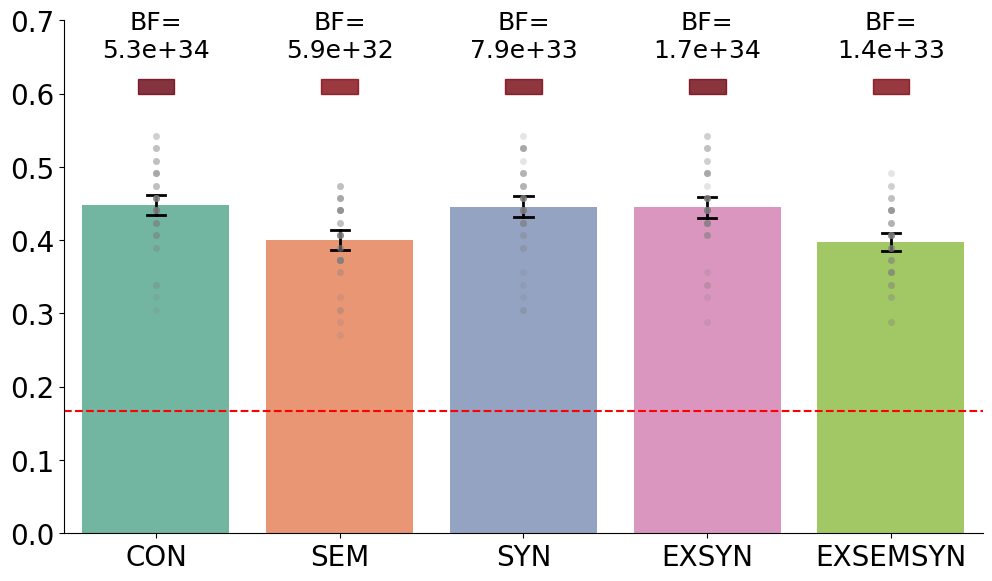

In [36]:
plot_accuracy_per_condition(df_avg, bf_dict, stripplot=True, connect_means=False)

In [43]:
# Paired ttest
# Example: Comparing accuracy between two conditions (e.g., 'CON' and 'SEM')
con_a = "CON"
con_b = "EXSEMSYN"
condition_a = df_avg[df_avg['Condition'] == con_a]['Accuracy']
condition_b = df_avg[df_avg['Condition'] == con_b]['Accuracy']

# Perform a Bayesian paired t-test
bayes_test_result = pg.ttest(x=condition_a, y=condition_b, paired=True, alternative='greater')

# Print the results
print(bayes_test_result[['T', 'dof', 'p-val', 'CI95%', 'cohen-d', 'BF10']])

               T  dof     p-val        CI95%  cohen-d     BF10
T-test  3.864583   49  0.000164  [0.02, inf]  0.63661  155.775


### Plot all configurations next to each other

In [38]:
# load all results
res_df_all = pd.read_csv(f'../results/classification_results/SCEGRAM_randomforest_classification_results_runs-{N_RUNS}_all.csv')

# filter config
configs = (('completeBOW','category','uniform'),('complete','category','uniform'), ('binary','category','distance_angle'), ('binary','uniform','distance_angle'), ('complete','uniform','uniform'))

dfs = []

for graph_type, node_feat, edge_feat in configs:
    df = res_df_all[(res_df_all['Node Features'] == node_feat) & (res_df_all['Edge Features'] == edge_feat) & 
                    (res_df_all['graph_type'] == graph_type)]
    df['Config'] = f'{graph_type}_{node_feat}_{edge_feat}'
    # average over runs
    df_avg = df.groupby(['Config','Run'])['Accuracy'].mean().reset_index()
    dfs.append(df_avg)

df_configs = pd.concat(dfs)
df_configs

/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_81315/35742451.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Config'] = f'{graph_type}_{node_feat}_{edge_feat}'
/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_81315/35742451.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Config'] = f'{graph_type}_{node_feat}_{edge_feat}'
/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_81315/35742451.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

,Config,Run,Accuracy
0,completeBOW_category_uniform,0,0.406780
1,completeBOW_category_uniform,1,0.359322
2,completeBOW_category_uniform,2,0.352542
3,completeBOW_category_uniform,3,0.437288
4,completeBOW_category_uniform,4,0.413559
...,...,...,...
45,complete_uniform_uniform,45,0.291525
46,complete_uniform_uniform,46,0.372881
47,complete_uniform_uniform,47,0.240678
48,complete_uniform_uniform,48,0.372881


In [40]:
# Paired ttest

bf_dict = {}
contrasts = [('completeBOW_category_uniform', 'complete_uniform_uniform'),('complete_category_uniform', 'complete_uniform_uniform'),('binary_category_distance_angle', 'complete_uniform_uniform'), ('binary_uniform_distance_angle', 'complete_uniform_uniform')]
for con_a, con_b in contrasts:
    condition_a = df_configs[df_configs['Config'] == con_a]['Accuracy']
    condition_b = df_configs[df_configs['Config'] == con_b]['Accuracy']

    # Perform a Bayesian paired t-test
    bayes_test_result = pg.ttest(x=condition_a, y=condition_b, paired=True, alternative='greater')

    # Print the results
    print(bayes_test_result[['T', 'dof', 'p-val', 'CI95%', 'cohen-d', 'BF10']])
    bf_dict[con_a] = bayes_test_result['BF10'].values[0]

bf_dict['complete_uniform_uniform'] = 0
bf_dict

                T  dof         p-val        CI95%   cohen-d       BF10
T-test  10.731757   49  9.164034e-15  [0.07, inf]  2.242856  7.845e+11
                T  dof         p-val        CI95%   cohen-d      BF10
T-test  16.151733   49  1.462182e-21  [0.08, inf]  2.728341  3.03e+18
               T  dof         p-val        CI95%   cohen-d       BF10
T-test  8.427066   49  2.139620e-11  [0.04, inf]  1.665994  4.545e+08
               T  dof     p-val        CI95%   cohen-d   BF10
T-test  1.115467   49  0.135046  [-0.0, inf]  0.208523  0.552


{'completeBOW_category_uniform': '7.845e+11',
 'complete_category_uniform': '3.03e+18',
 'binary_category_distance_angle': '4.545e+08',
 'binary_uniform_distance_angle': '0.552',
 'complete_uniform_uniform': 0}

/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_81315/3991908489.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Reds')
/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_81315/3991908489.py:28: RuntimeWarning: divide by zero encountered in log10
  log_bayes_factors = {k: np.log10(float(v)) for k, v in bfs.items()}
/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_81315/3991908489.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Reds')


[784500000000.0, 3.03e+18, 454500000.0, 0.552, 0.0]


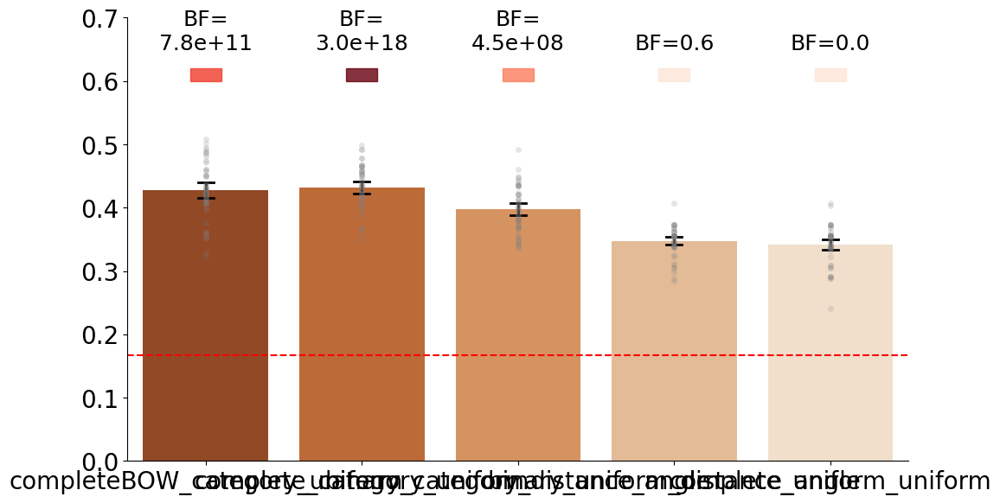

In [41]:
conditions_order = ['completeBOW_category_uniform','complete_category_uniform', 'binary_category_distance_angle', 'binary_uniform_distance_angle', 'complete_uniform_uniform']
bf_dict = {condition: float(bf_dict[condition]) for condition in conditions_order}

plot_accuracy_per_condition(df_configs, bfs=bf_dict, x='Config', y='Accuracy', ylim=(0, 0.7), connect_means=False, stripplot=True,
                            conditions_order=conditions_order,
                            palette=sns.color_palette("Oranges", n_colors=len(conditions_order), desat=0.8)[::-1])


## Run DNN

In [ ]:
dnn_embeds = load_dnn_embeds(dnn_layers, archname)
dnn_embeds = preproc_dnn_embeds(dnn_embeds)
N_RUNS = 1
res_all = []

for run in range(N_RUNS):
    for layer, embeds in dnn_embeds.items():
       
        # Initialize lists to store accuracy and report
        y_pred = []
        y_actual = []
        conditions = []
        img_ids = []

        # Loop through each condition and run the classification
        for condition, indices in zip(CONDITIONS, [range(60),range(60,119),range(119,179),range(179,238),range(238,298),range(298,357)]):
            dnn_embeds_cond = embeds[indices,:]
            y_pred_list, y_actual_list, conditions_list, img_id_list = run_model(RandomForestClassifier(max_depth=20, min_samples_leaf=4, n_estimators=200), dnn_embeds_cond, df, filter=True, condition=condition, y_col='sce_category', condition_col='consistency_category')
            y_pred.extend(y_pred_list)
            y_actual.extend(y_actual_list)
            conditions.extend(conditions_list)
            img_ids.extend(img_id_list)

        # Save results to a DataFrame
        results = pd.DataFrame({
            'Run': [run] * len(y_pred),
            'Condition': conditions,
            'Img_Id': img_ids,
            'Predicted Rating': y_pred,
            'Actual Rating': y_actual,
            'Accuracy': [1 if pred == actual else 0 for pred, actual in zip(y_pred, y_actual)],
            'Layer': layer,
        })

        res_all.append(results)
res_df = pd.concat(res_all)

In [ ]:
res_df.to_csv(f'../results/classification_results/{archname}-SCEGRAM_classification_results_runs-{N_RUNS}.csv', index=False)

### Plot

In [ ]:
res_df = pd.read_csv(f'../results/classification_results/{archname}-SCEGRAM_classification_results_runs-{N_RUNS}.csv')

In [ ]:
plot_accuracy_per_condition(res_df, dnn=True)

# Ratings regression

predict consistency ratings from embeddings.

1) **Linear Regression**: If you believe the relationship between the embeddings and the consistency ratings is approximately linear, you can use simple Linear Regression. This is a basic model but can provide a strong baseline.

2) **Ridge or Lasso Regression**: These are regularized versions of linear regression, which can help control overfitting if your dataset is not large.
Ridge regression uses L2 regularization, while Lasso uses L1 regularization (Lasso can also perform feature selection by driving some coefficients to zero).

3) **Polynomial Regression**: If the relationship between the embeddings and the ratings is non-linear, you can use polynomial regression by adding interaction terms or polynomial features from your embeddings.

4) **Support Vector Regression (SVR)**: If the relationship is more complex and not easily captured by a simple linear model, SVR with different kernels (like radial basis function (RBF)) can be used to model more complex relationships.

5) **Neural Networks (Deep Learning)**: Given that embeddings are often outputs from neural networks, using a small neural network (such as a feed-forward network) to predict the consistency ratings from the embeddings can be a powerful approach, especially if there are non-linear relationships involved.

6) **Random Forest or Gradient Boosting (e.g., XGBoost):** These are tree-based methods that can capture complex, non-linear relationships and work well when you have a relatively small dataset and want to avoid overfitting.


First, plot ratings per condition with boxplots


### T-sne

In [ ]:
EPOCH = "FINAL"
node = False

binary = False
anchor_weighted = False

remove_outliers = False

for i, (node, edge) in configs.items():
    df = load_scegram_data()
    df.reset_index(drop=True, inplace=True)
    node_string = '_'.join(node)
    edge_string = '_'.join(edge)
    out_string = f'h{HIDDEN_CHANNELS}_mod{MOD}_lr{LR}_bs{BATCH_SIZE}_stimsetADEK20K_edge-{edge_string}_node-{node_string}_binary-{binary}_weighted-{anchor_weighted}_1'

    embeds, outliers = load_embed_data(CONDITIONS, out_string, TRAINSET, EPOCH, node=node, remove_outliers=remove_outliers)
    
    if remove_outliers:
        df = remove_outliers_from_df(df, CONDITIONS, outliers)

    #ratings
    ratings = df['consistency_rating'].values
    con_cat = df['consistency_category'].values
    con = df['consistency_code'].values
    ids = df['sce_ID'].values
    cats = df['sce_category'].values
    # new variable "consistency_bin" which is 1 if consistency category is CON, SYN, or EXSYN, and 0 if consistency catgeory is SEM, SEMSYN, or EXSEMSYN
    df['consistency_bin'] = [1 if x in ['EXSYN'] else 10 for x in df['consistency_category']]
    con_bin = df['consistency_bin'].values

    # tsne over embeds
    from sklearn.manifold import TSNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30
                )
    embeds_tsne = tsne.fit_transform(embeds)
    embeds_tsne.shape

    # plot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=embeds_tsne[:,0], y=embeds_tsne[:,1], hue=cats, palette='tab20')
    plt.title(f't-SNE of Embeddings - Node: {node_string}, Edge: {edge_string}')

## Plot ratings

In [ ]:
sns.set_palette('Set2')
df = load_scegram_data()

plt.figure(figsize=(10, 6))
# Create the boxplot
sns.boxplot(x='consistency_category', y='consistency_rating', data=df, zorder=1)

# Overlay the individual data points using stripplot
sns.stripplot(x='consistency_category', y='consistency_rating', data=df, 
              color='black', alpha=0.5, jitter=True, zorder=2)

# Calculate the mean for each consistency category
means = df.groupby('consistency_category')['consistency_rating'].mean()

# Overlay the mean as a red big diamond using the correct category positions
for i, mean in enumerate(means):
    plt.scatter(x=means.index[i], y=mean, color='red', marker="D", s=100, label='Mean' if i == 0 else "", zorder=3)

# Despine the plot (removes top and right spines)
sns.despine()

# Increase the size of the tick labels
plt.xticks(fontsize=20)  # Increase x-axis tick label size
plt.yticks(fontsize=20)  # Increase y-axis tick label size
plt.xlabel('')
plt.ylabel('')

plt.show()


In [ ]:
# plot distribution of consistency ratings
plt.figure(figsize=(10, 6))
sns.histplot(df['consistency_rating'], bins=20, kde=True)

In [ ]:
# 10 percent quantile
df['consistency_rating'].quantile(0.10)
# 90 percent quantile
df['consistency_rating'].quantile(0.90)
# 50 percent quantile
df['consistency_rating'].quantile(0.50)

print(df['consistency_rating'].quantile(0.10), df['consistency_rating'].quantile(0.90), df['consistency_rating'].quantile(0.50))

Regression:

variables
- DV: rating 
- IV: emebds

1. load embeddings based on node feats edge feats
2. predict consistency ratings, plot predicted ratings distribution

## Run GNN embeds

category uniform 0
(295,) (295, 10)


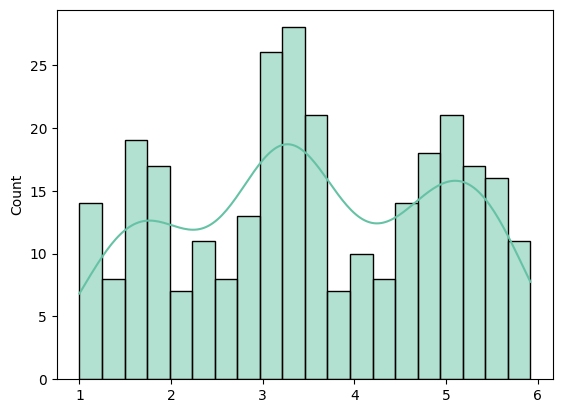

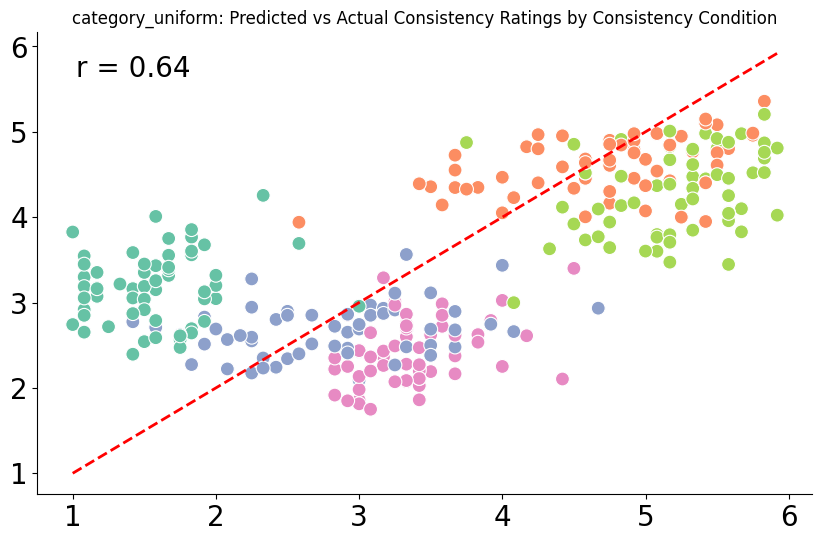

category uniform 1
(295,) (295, 10)


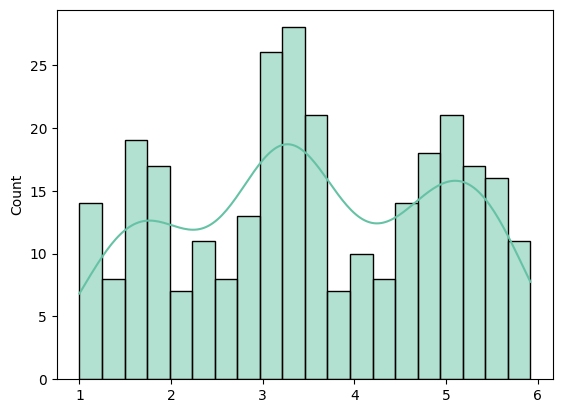

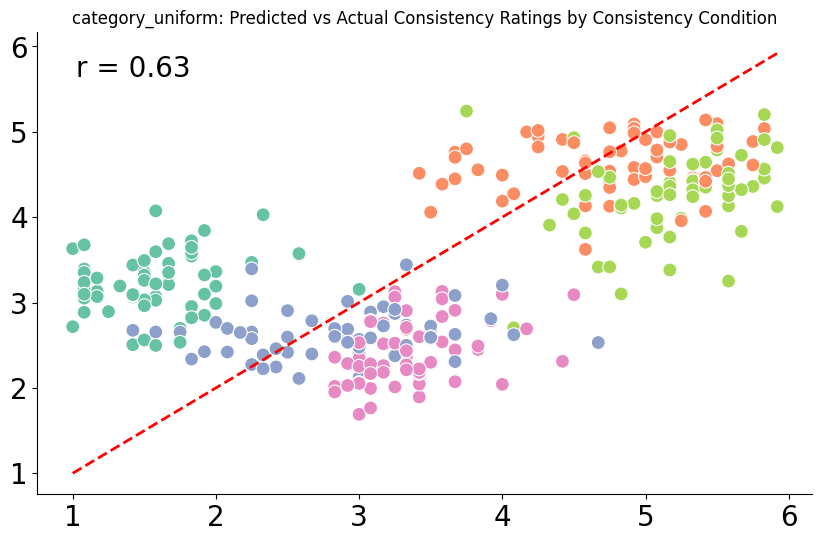

category uniform 2
(295,) (295, 10)


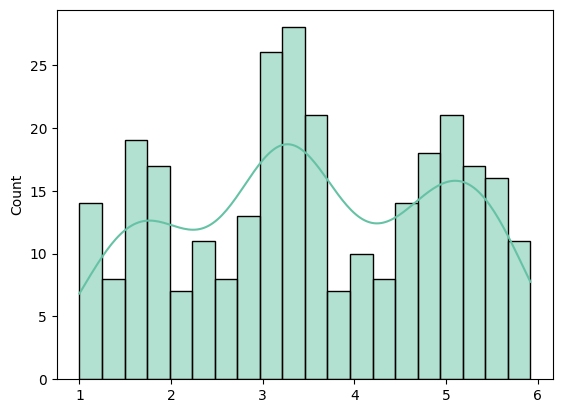

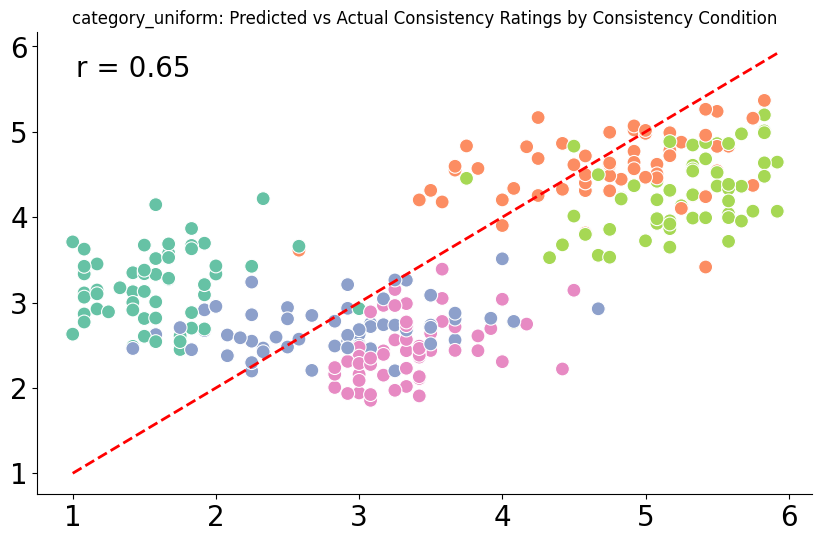

category uniform 3
(295,) (295, 10)


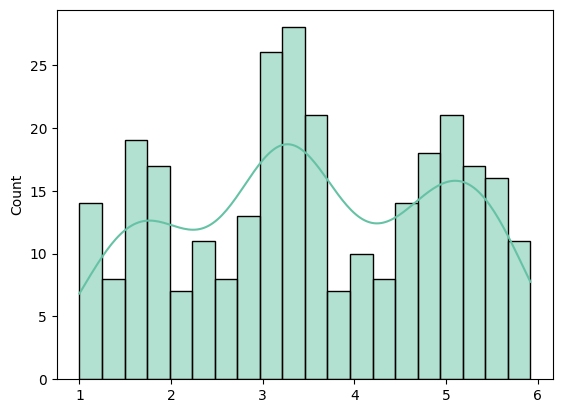

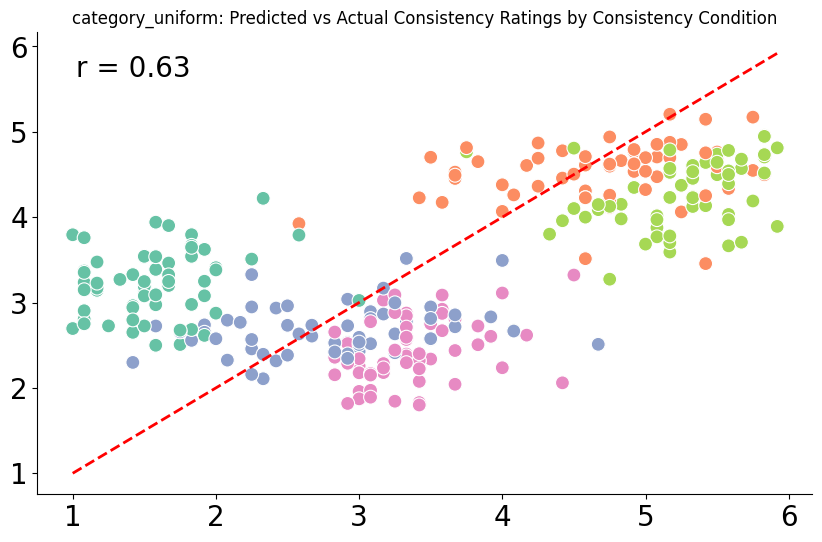

category uniform 4
(295,) (295, 10)


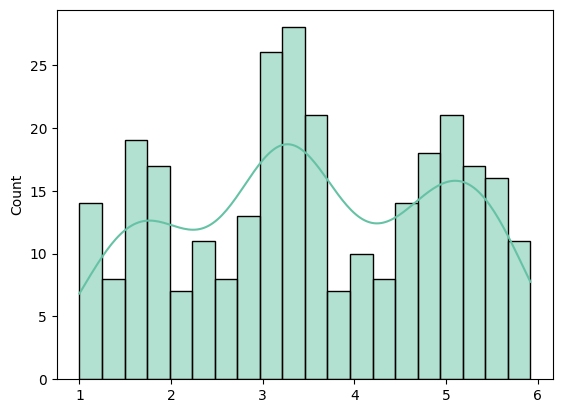

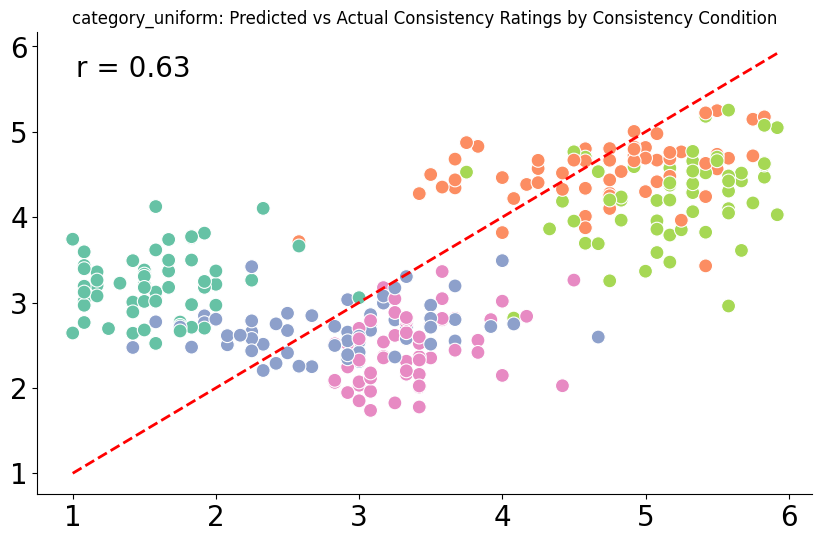

category uniform 5
(295,) (295, 10)


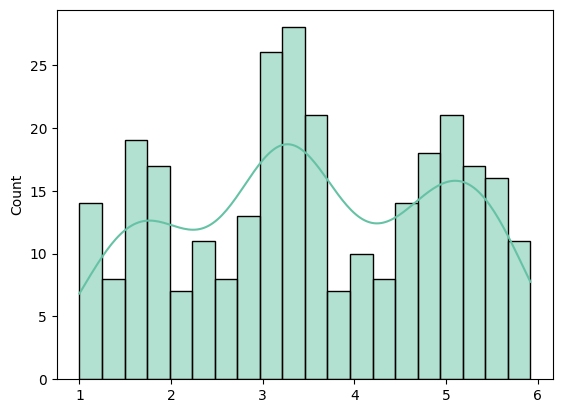

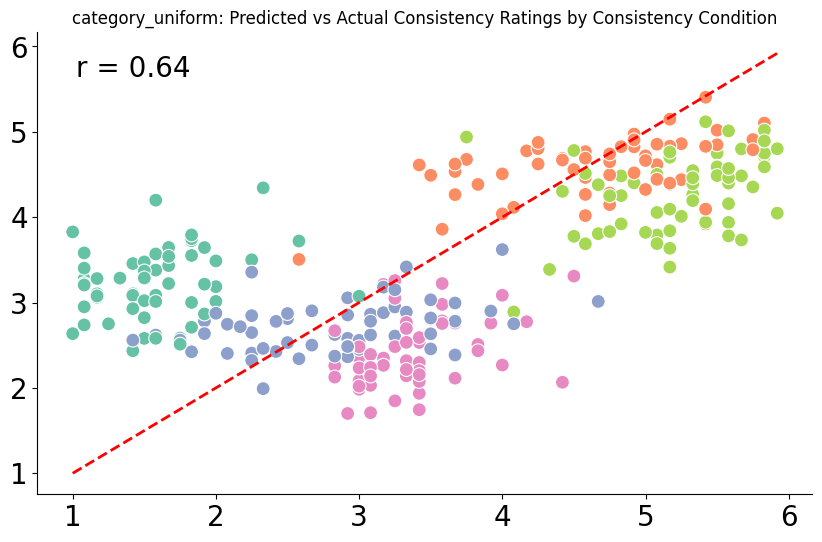

category uniform 6
(295,) (295, 10)


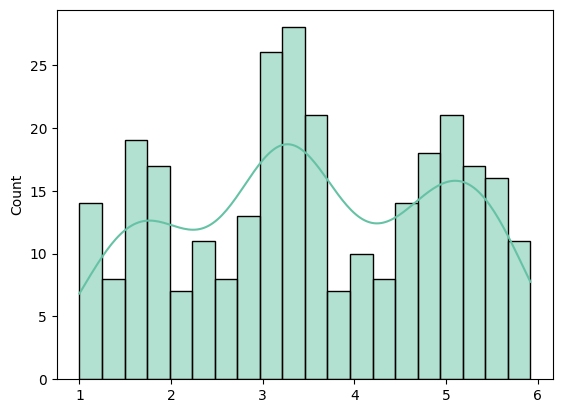

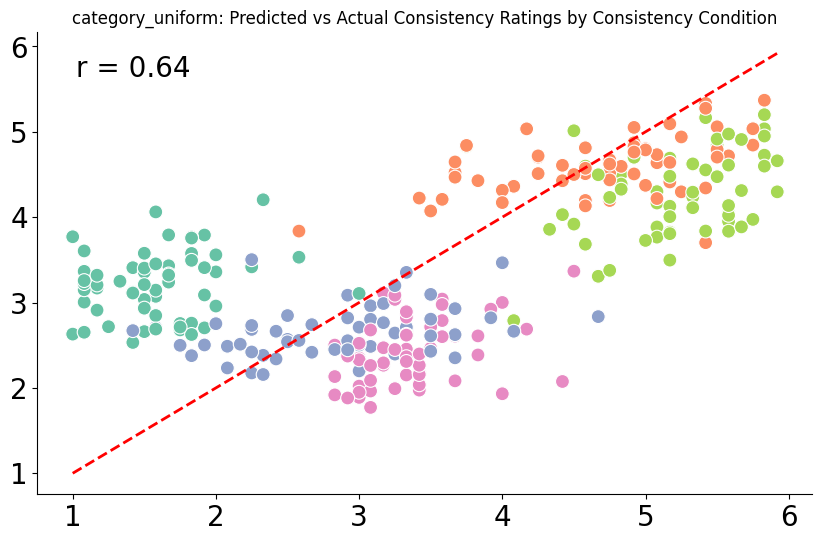

category uniform 7
(295,) (295, 10)


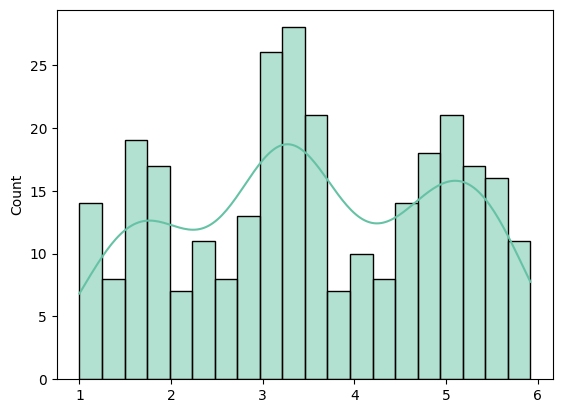

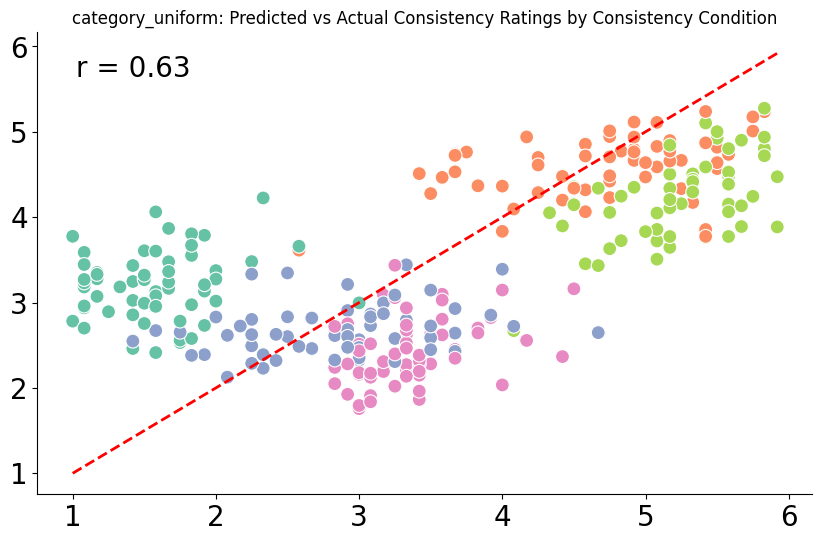

category uniform 8
(295,) (295, 10)


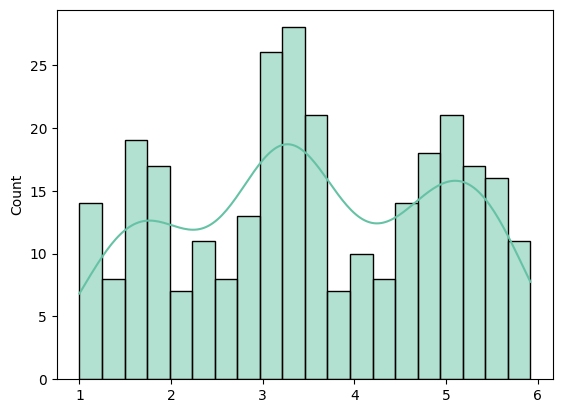

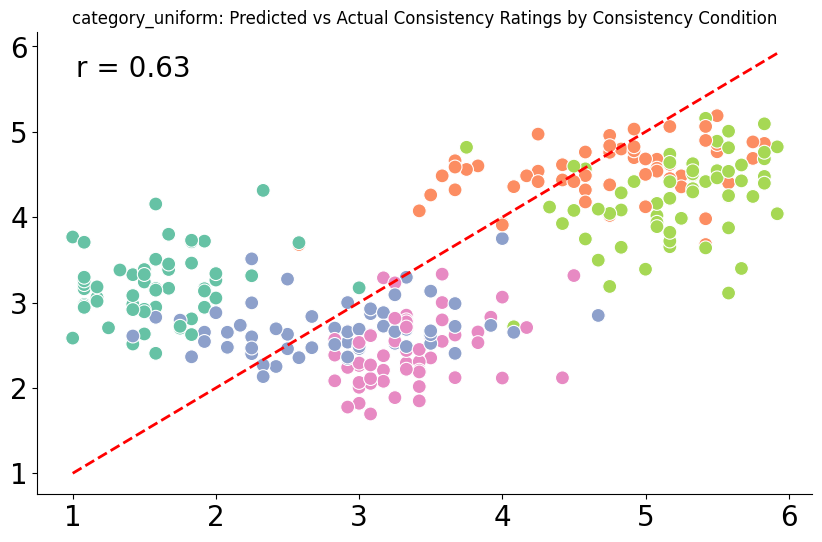

category uniform 9
(295,) (295, 10)


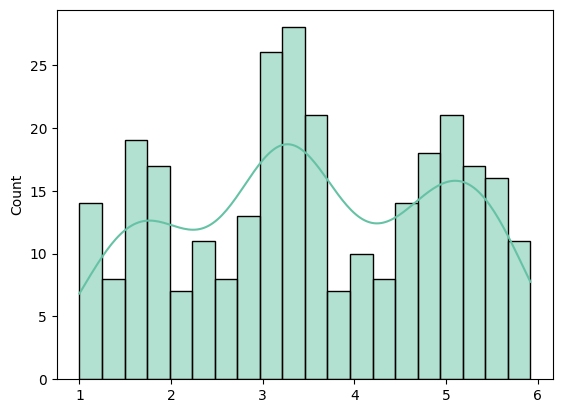

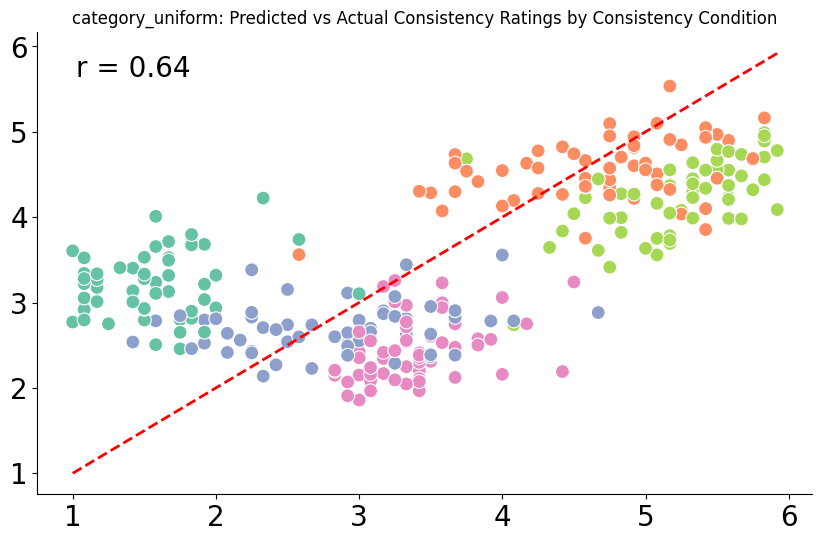

category uniform 10
(295,) (295, 10)


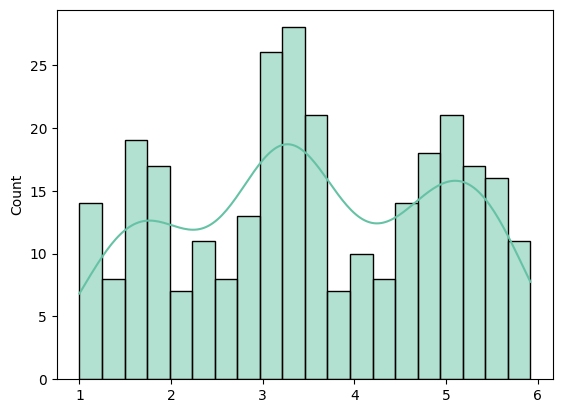

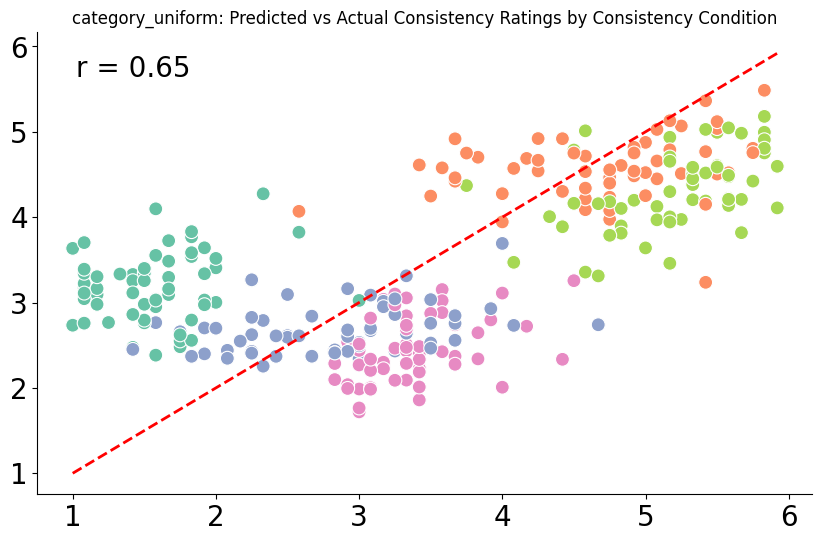

category uniform 11
(295,) (295, 10)


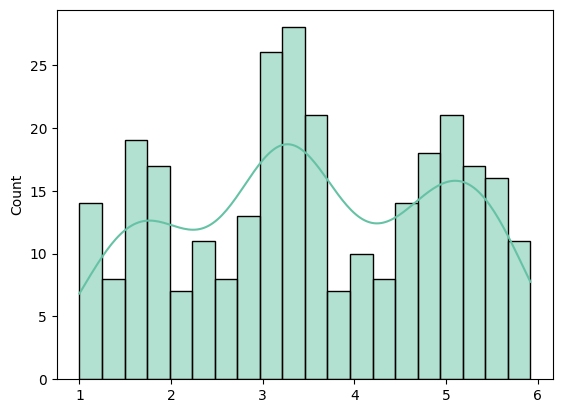

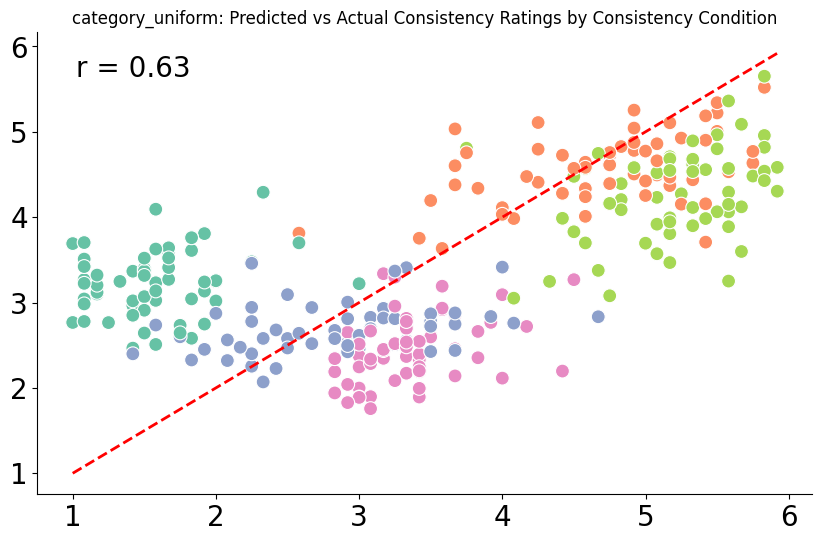

category uniform 12
(295,) (295, 10)


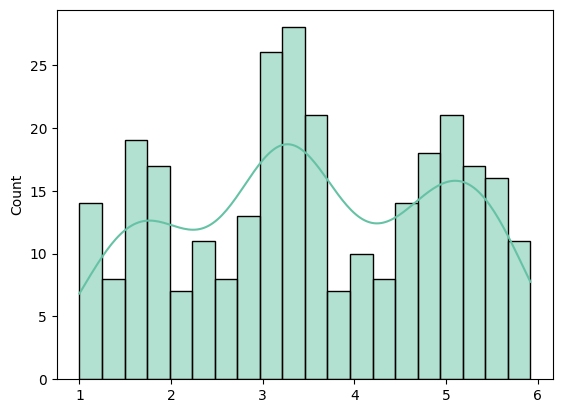

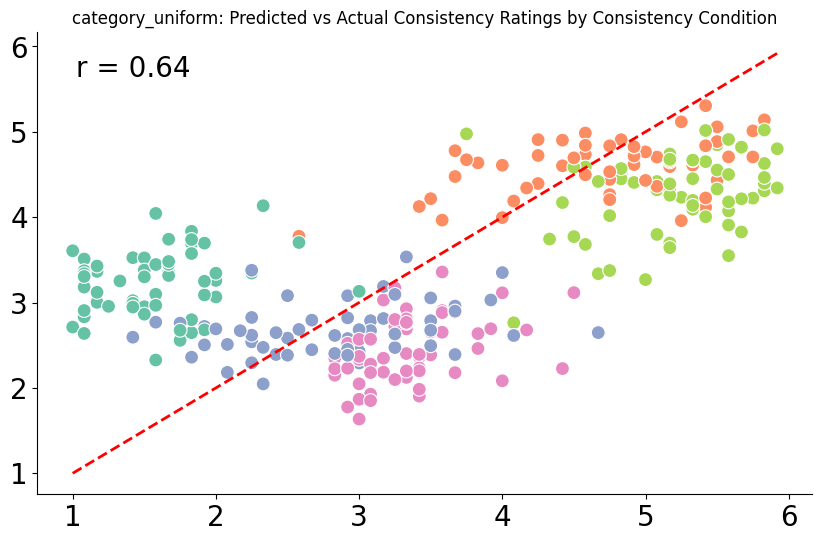

category uniform 13
(295,) (295, 10)


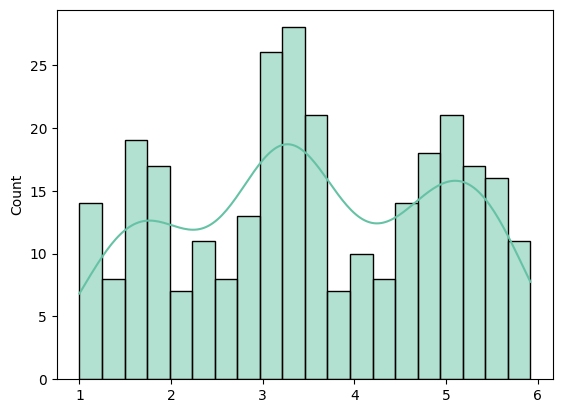

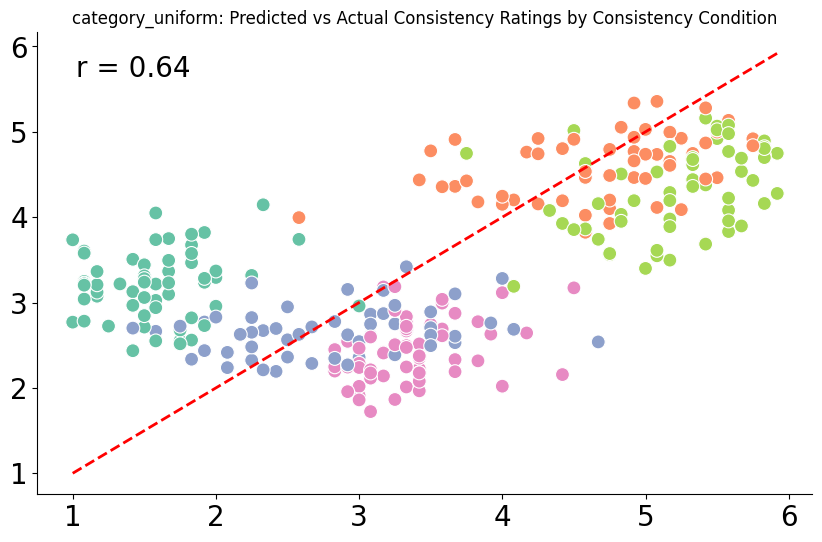

category uniform 14
(295,) (295, 10)


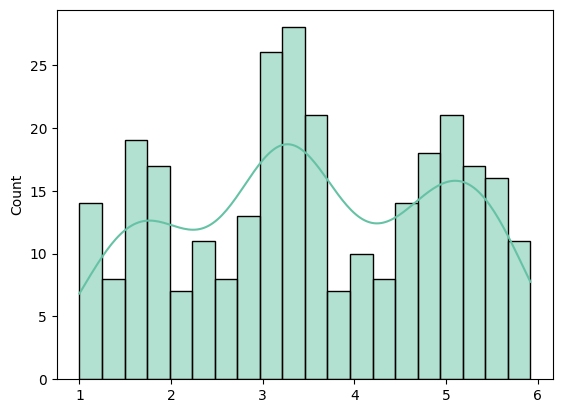

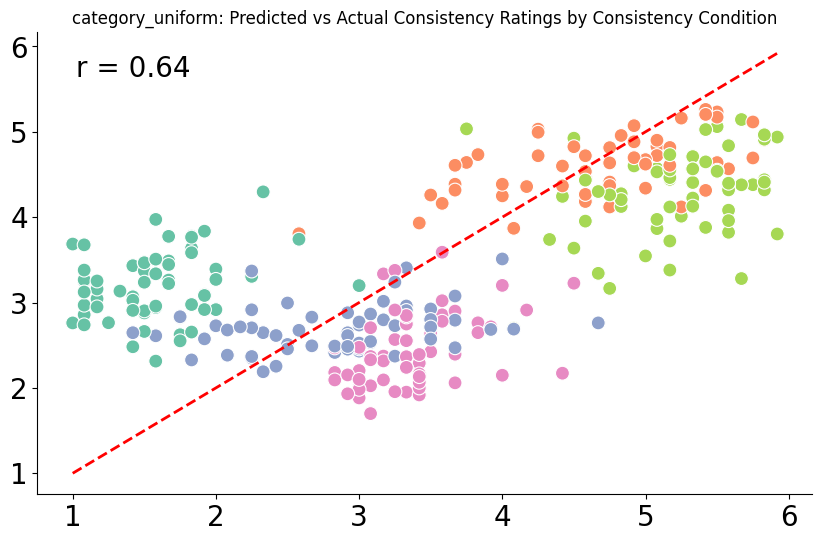

category uniform 15
(295,) (295, 10)


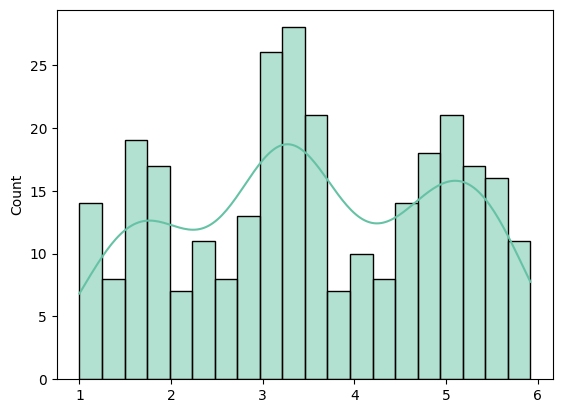

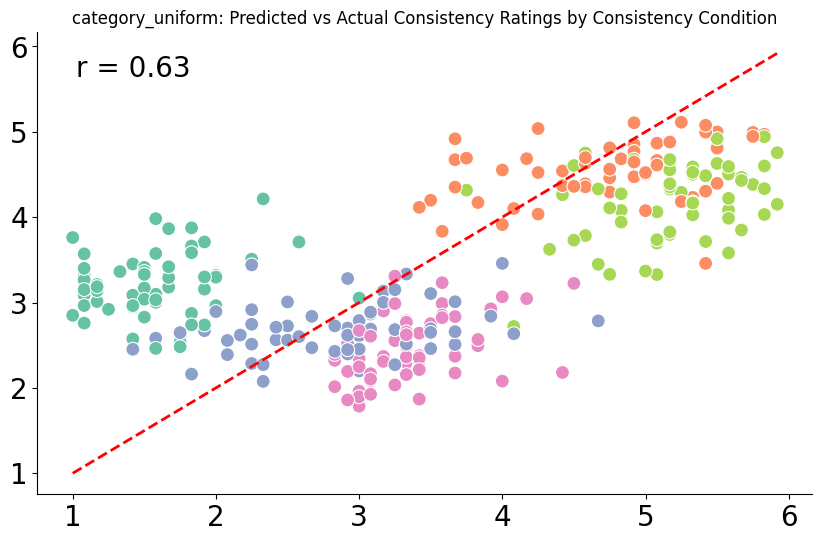

category uniform 16
(295,) (295, 10)


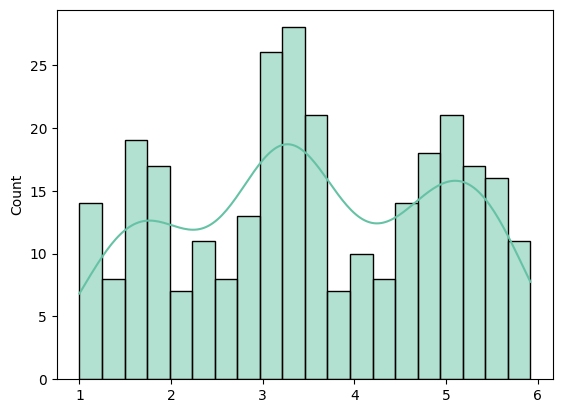

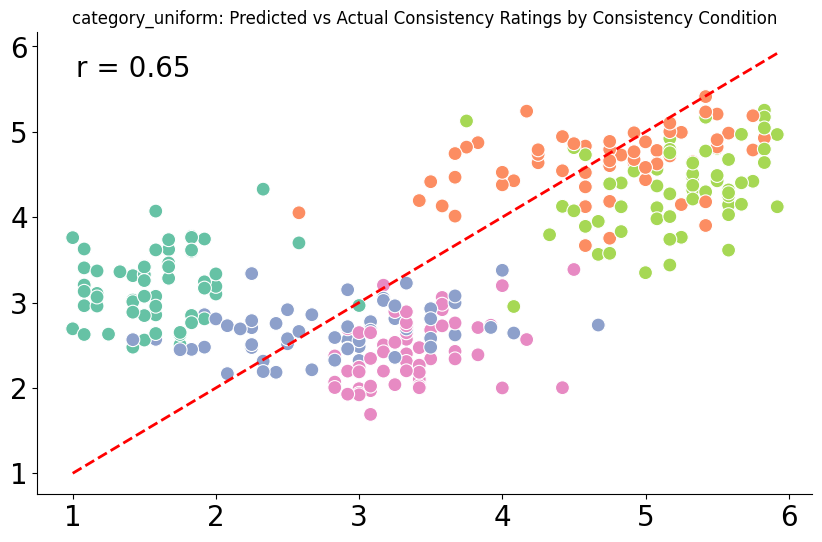

category uniform 17
(295,) (295, 10)


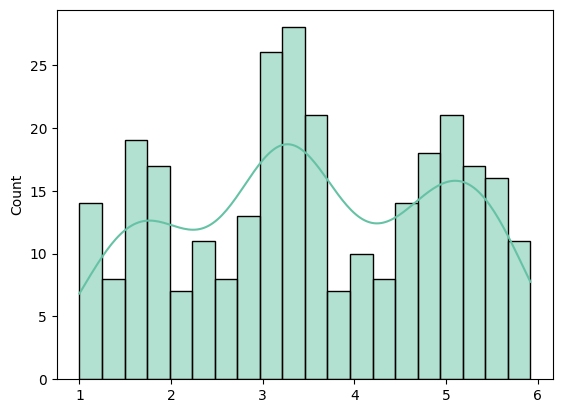

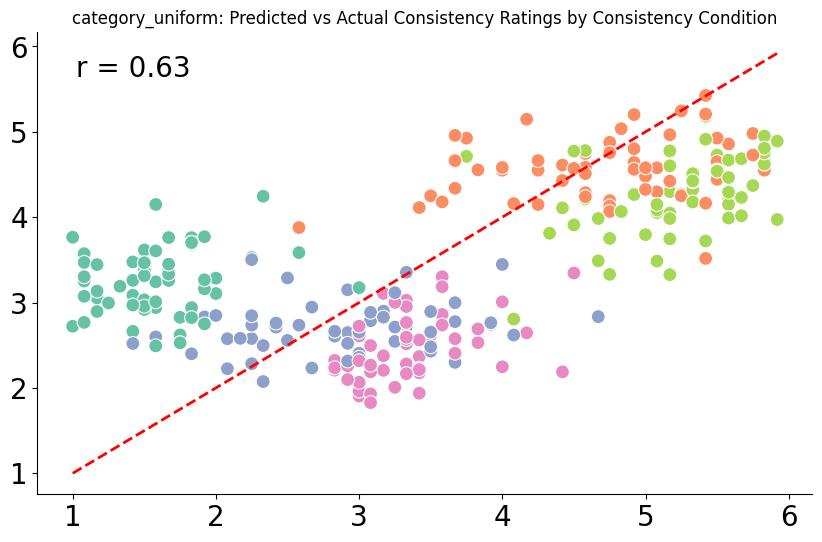

category uniform 18
(295,) (295, 10)


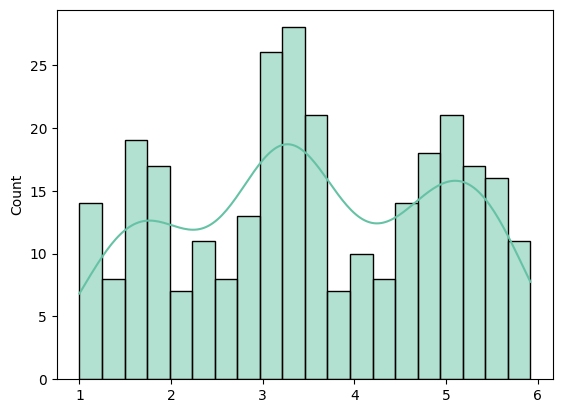

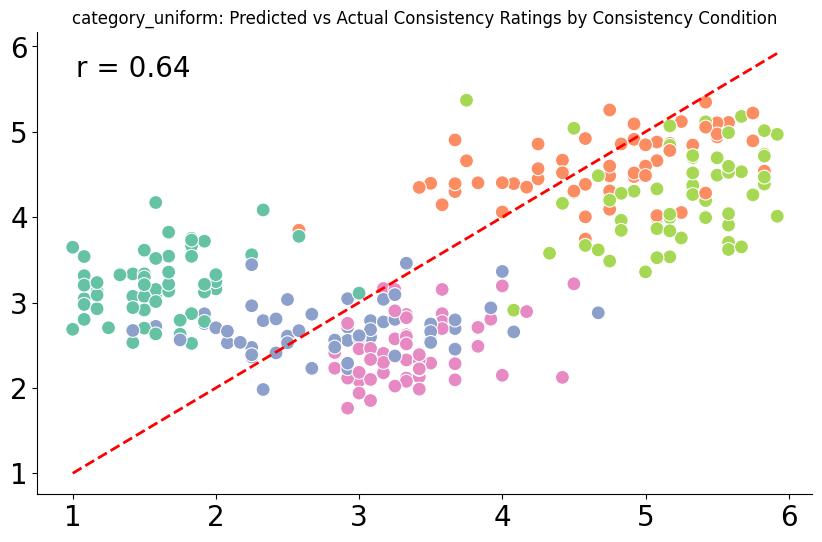

category uniform 19
(295,) (295, 10)


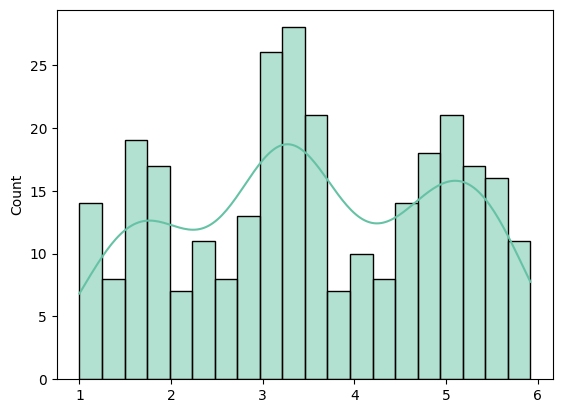

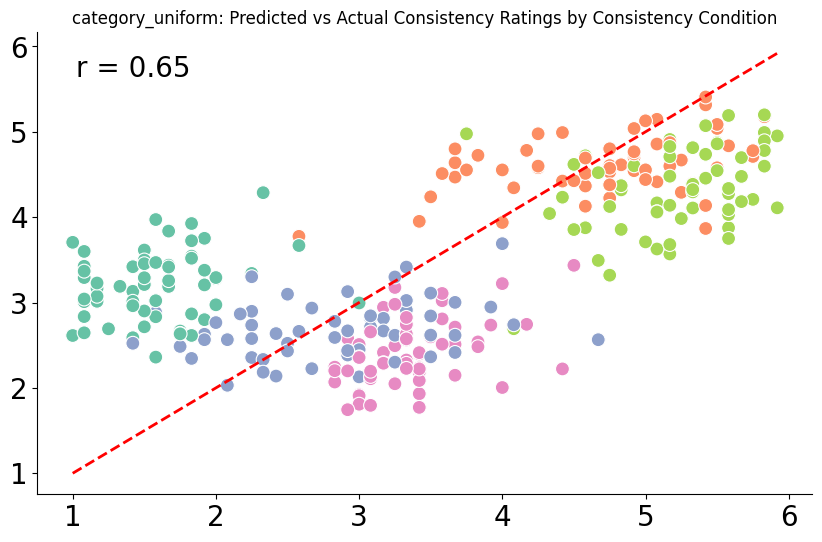

category uniform 20
(295,) (295, 10)


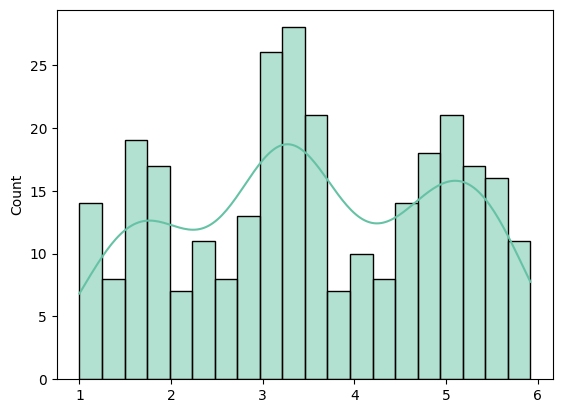

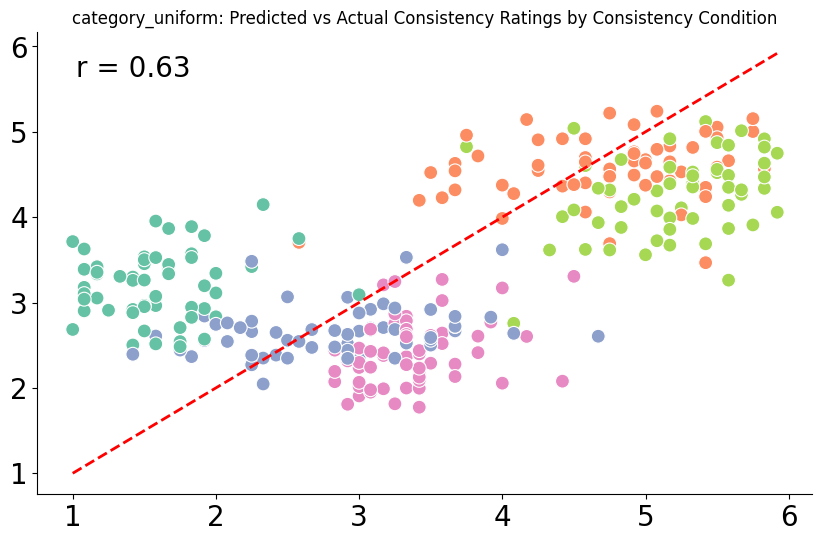

category uniform 21
(295,) (295, 10)


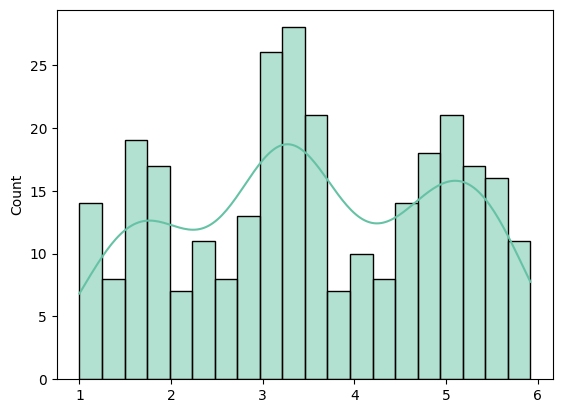

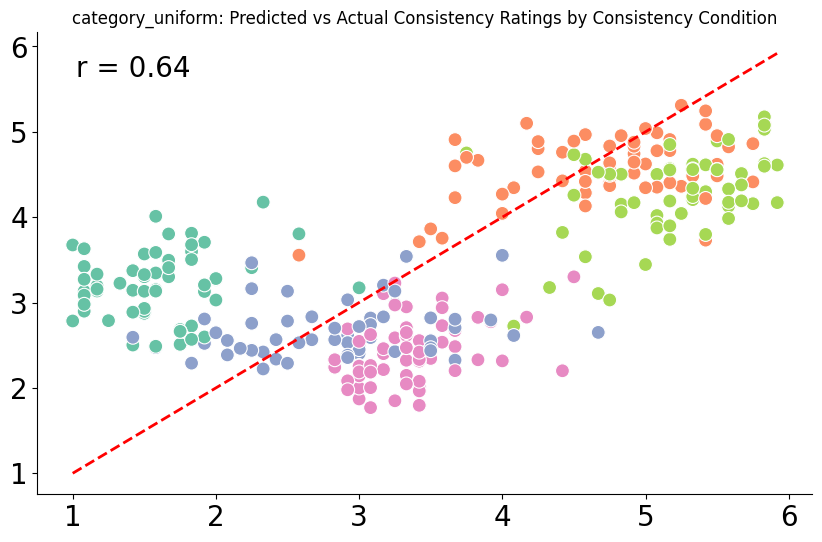

category uniform 22
(295,) (295, 10)


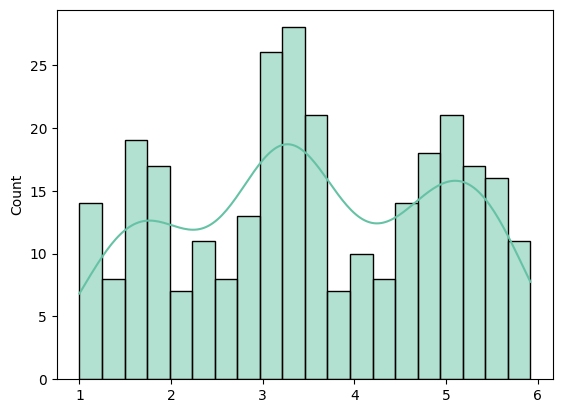

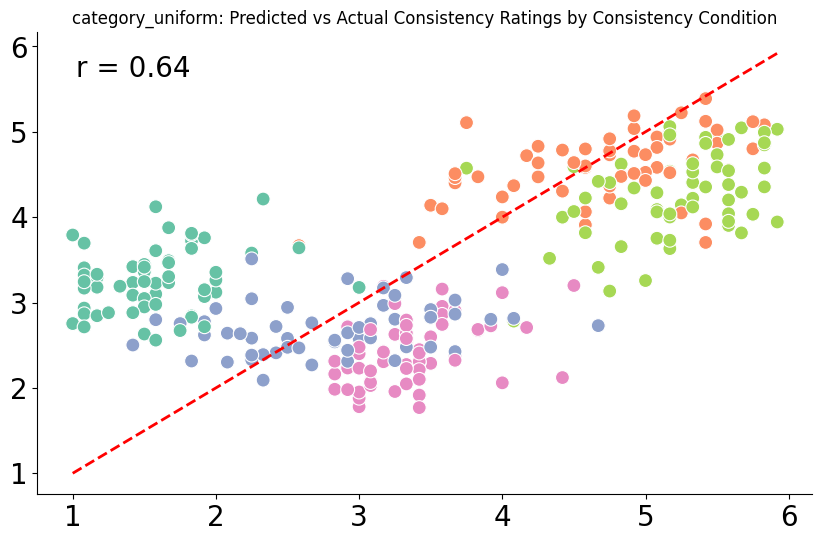

category uniform 23
(295,) (295, 10)


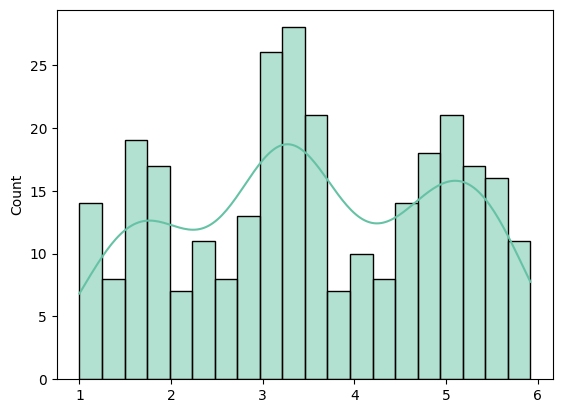

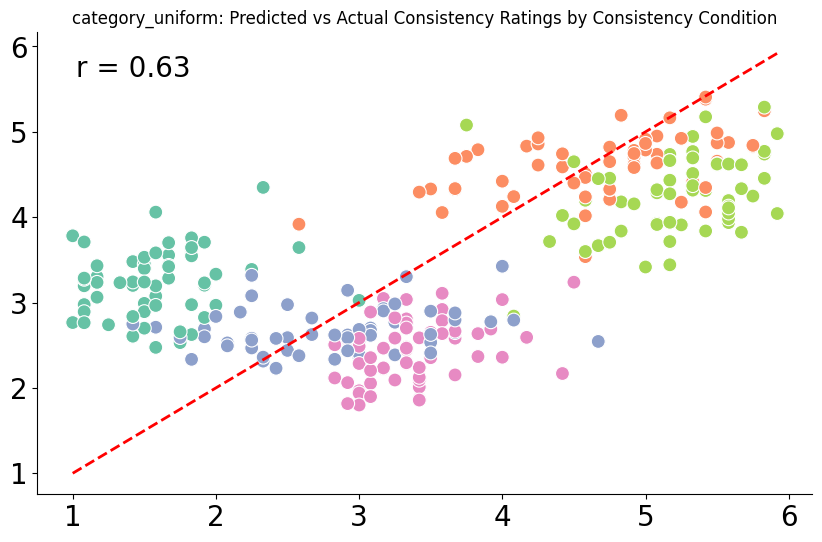

category uniform 24
(295,) (295, 10)


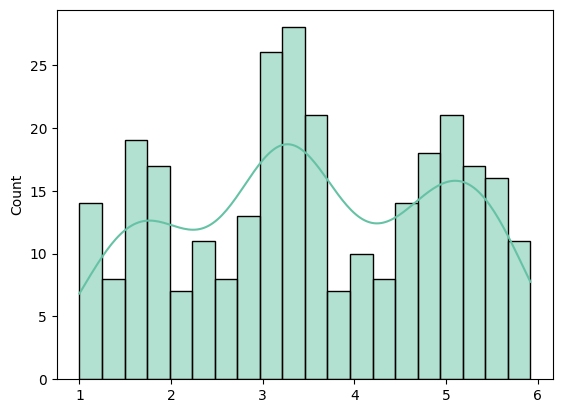

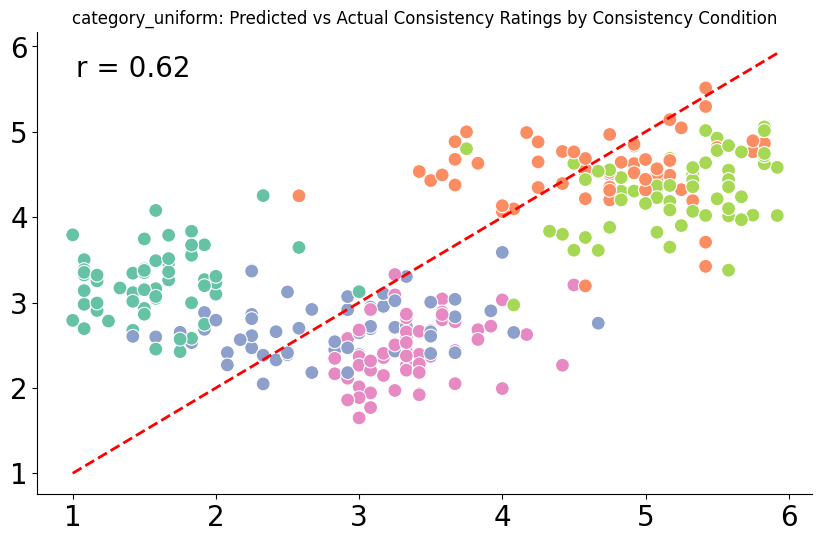

category uniform 25
(295,) (295, 10)


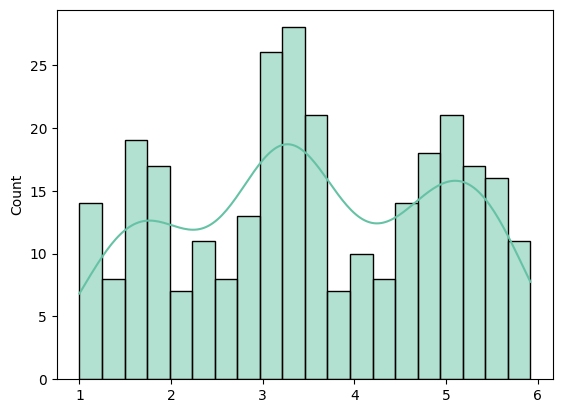

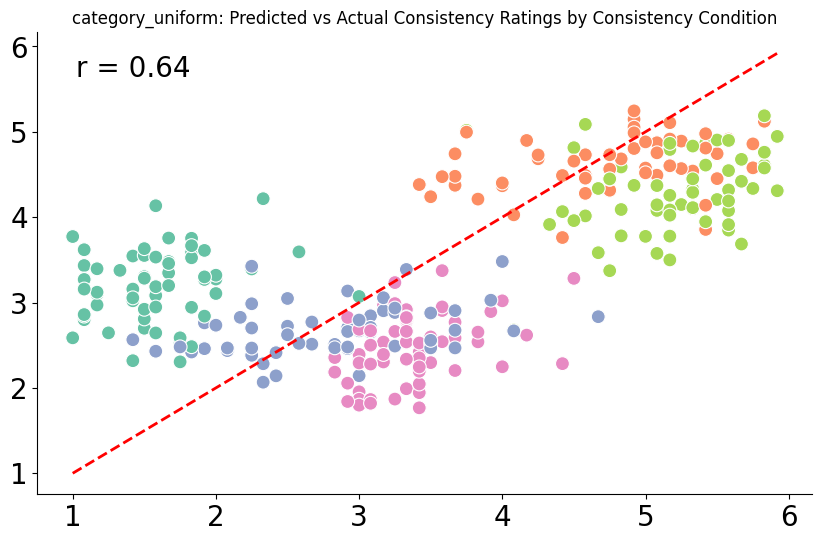

category uniform 26
(295,) (295, 10)


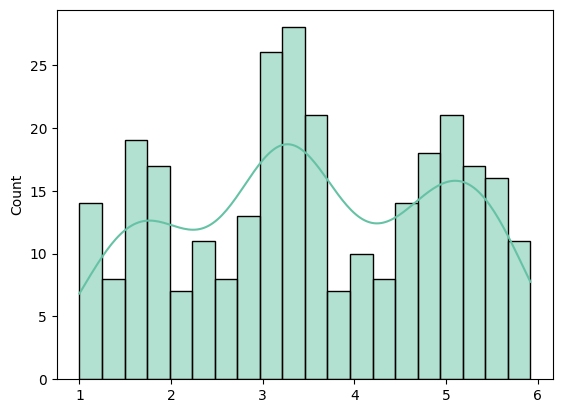

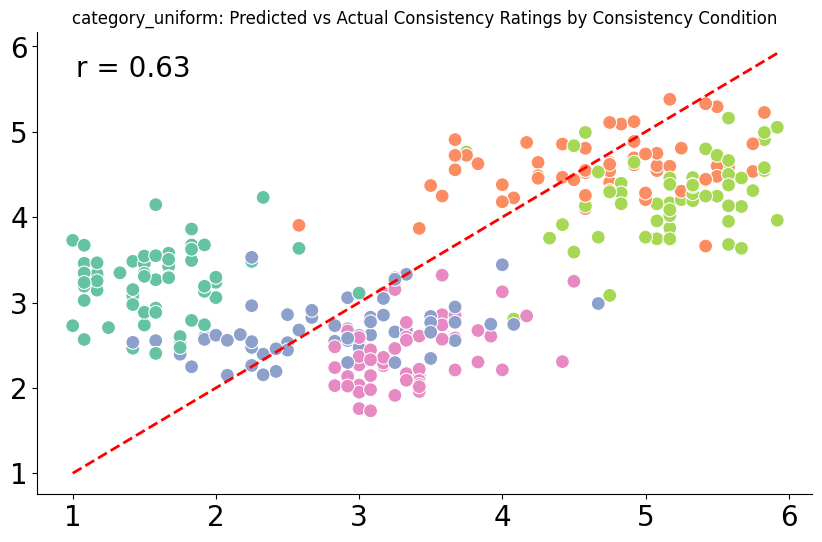

category uniform 27
(295,) (295, 10)


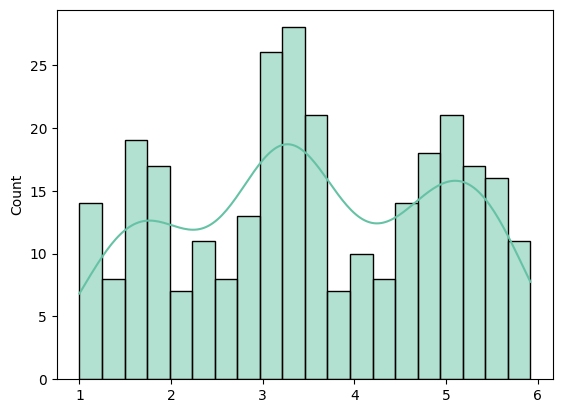

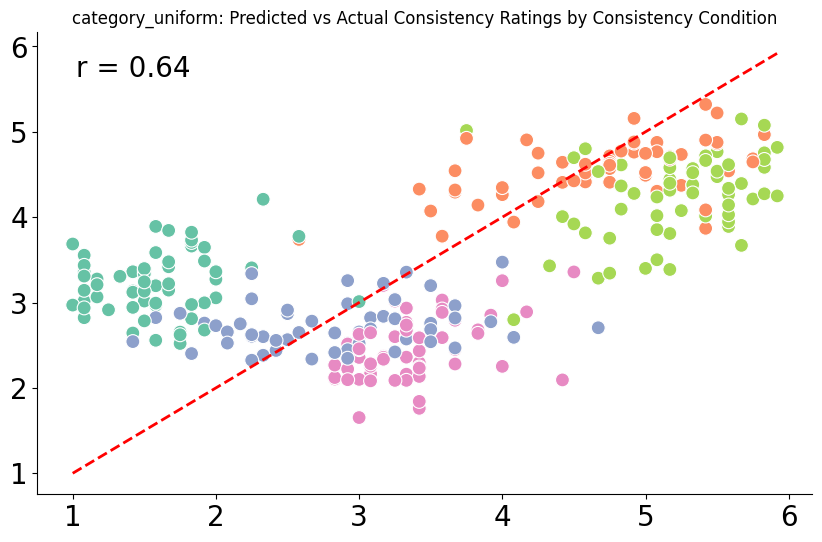

category uniform 28
(295,) (295, 10)


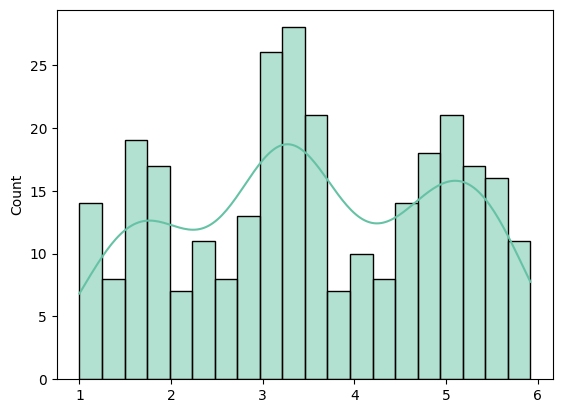

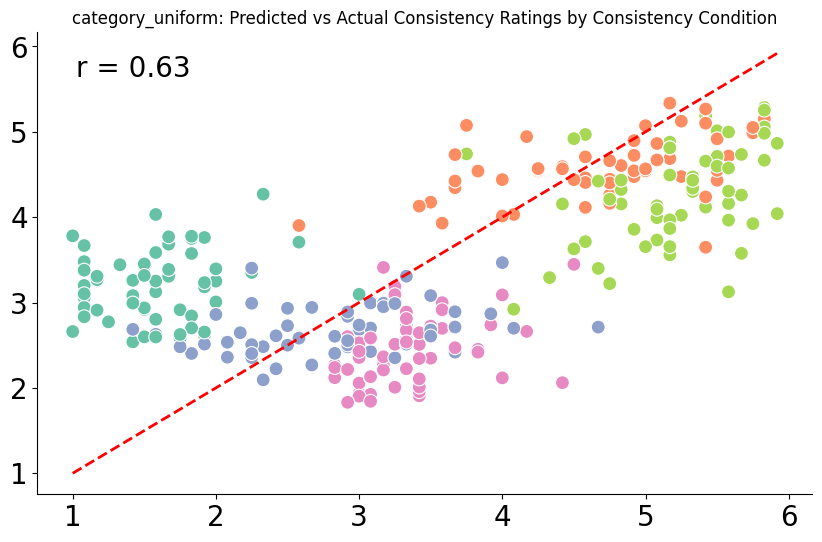

category uniform 29
(295,) (295, 10)


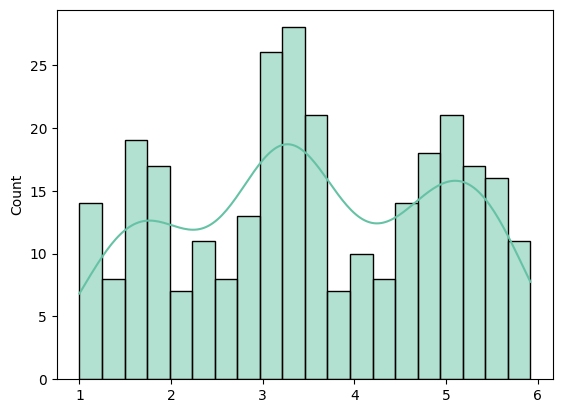

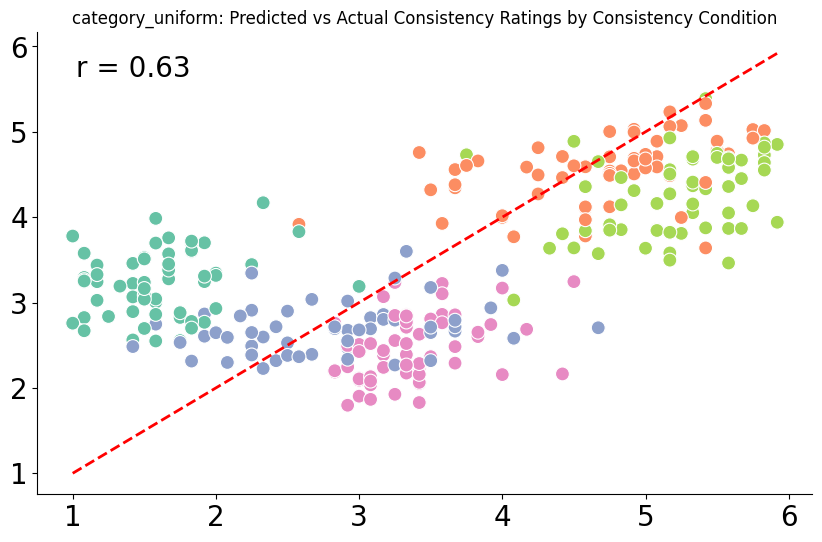

category uniform 30
(295,) (295, 10)


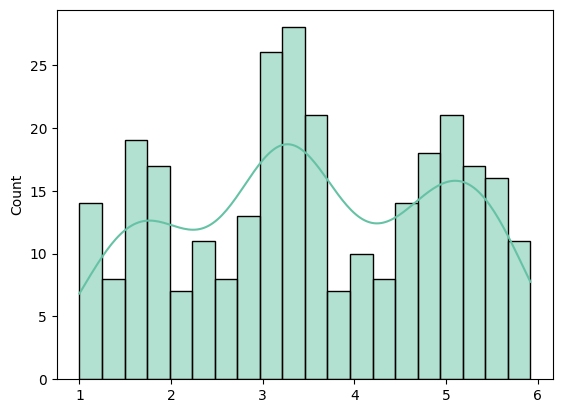

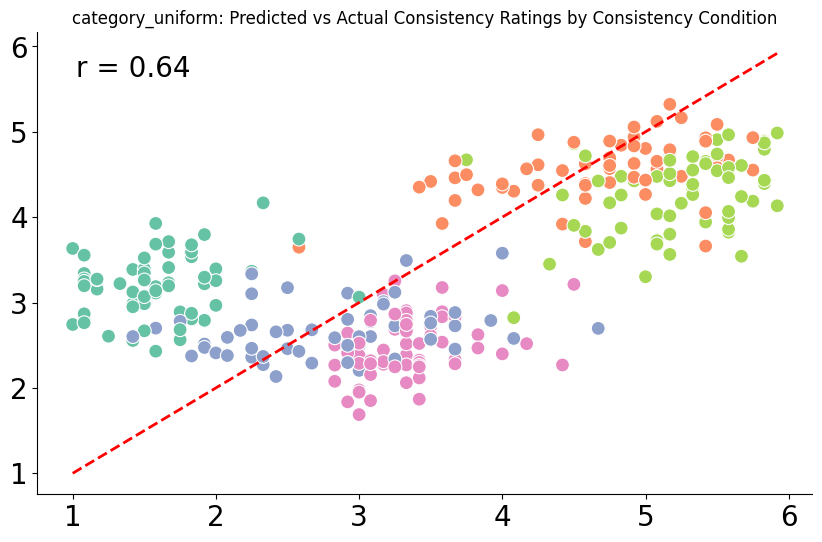

category uniform 31
(295,) (295, 10)


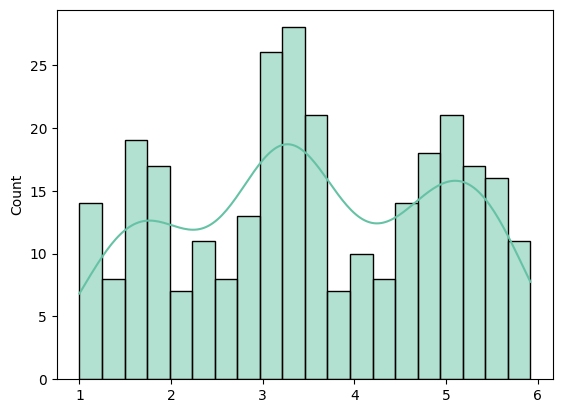

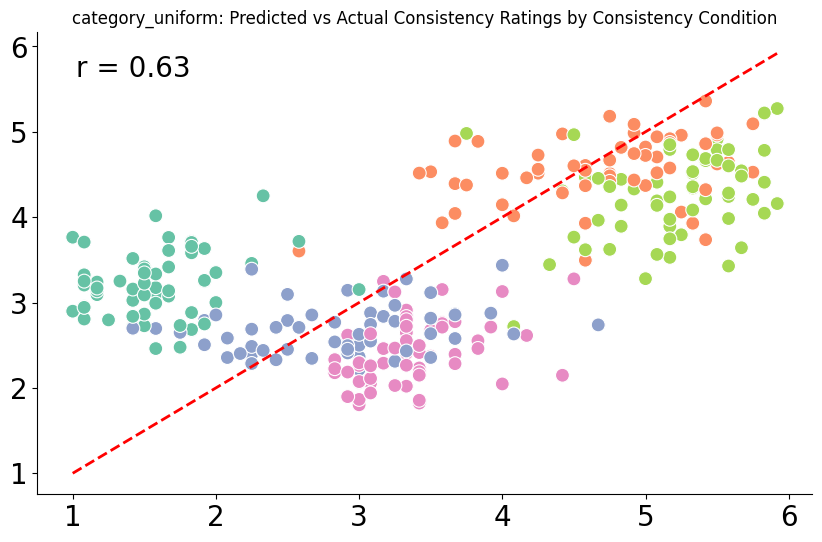

category uniform 32
(295,) (295, 10)


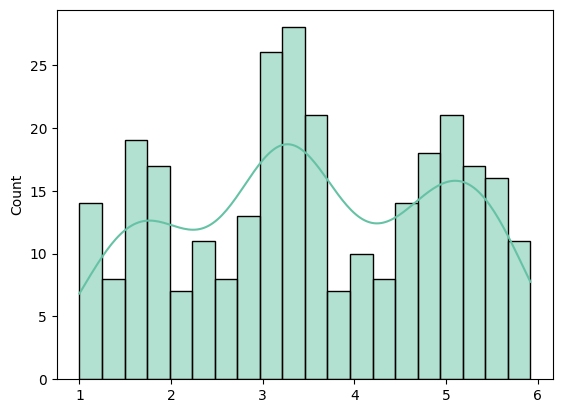

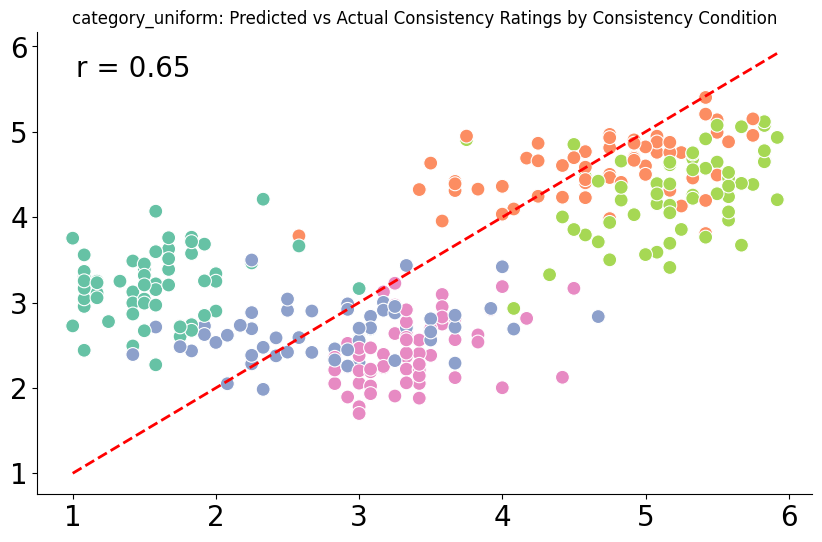

category uniform 33
(295,) (295, 10)


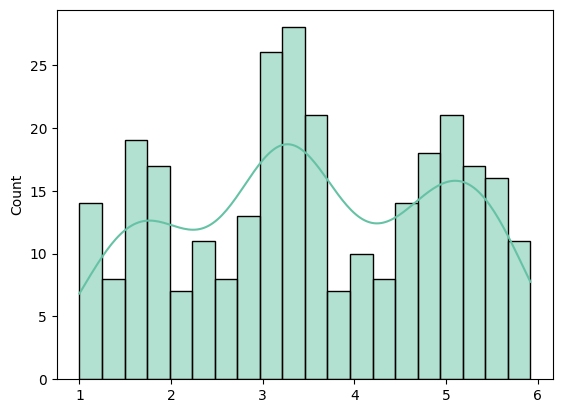

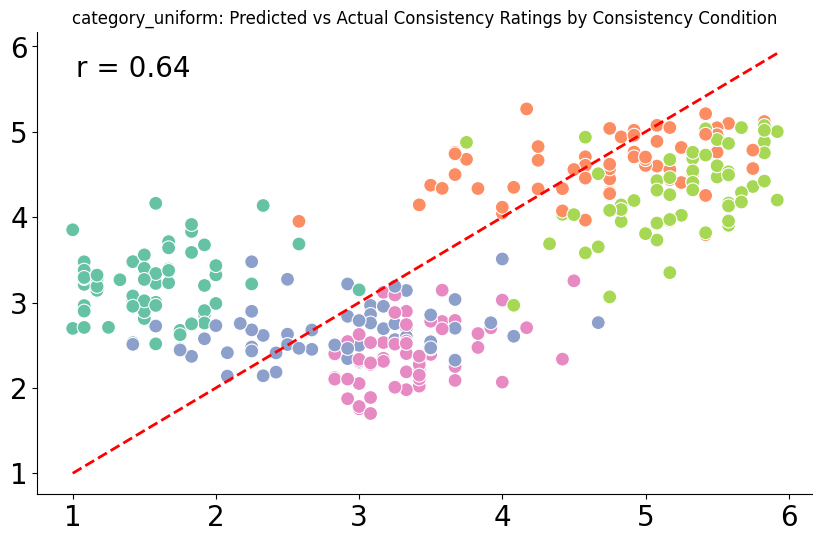

category uniform 34
(295,) (295, 10)


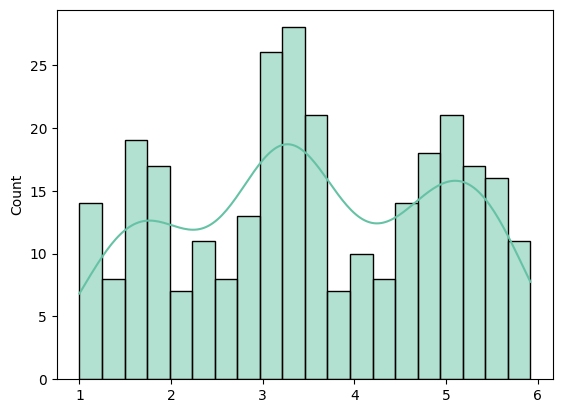

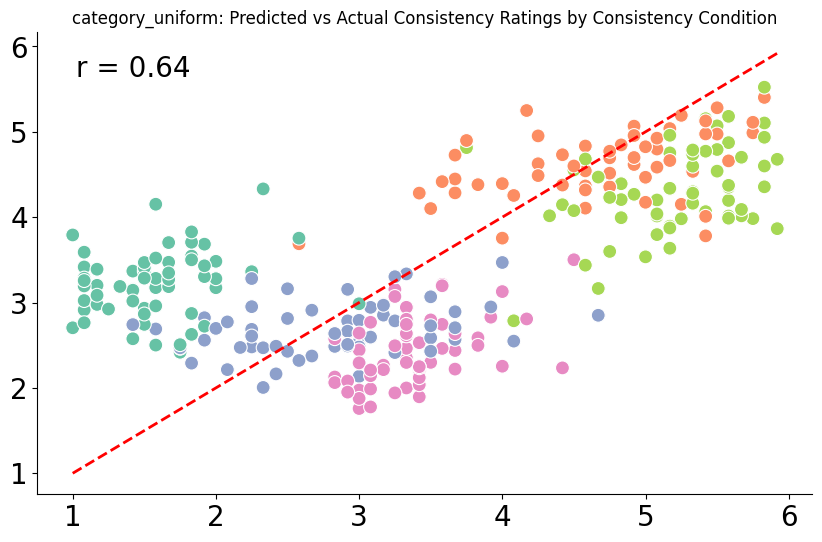

category uniform 35
(295,) (295, 10)


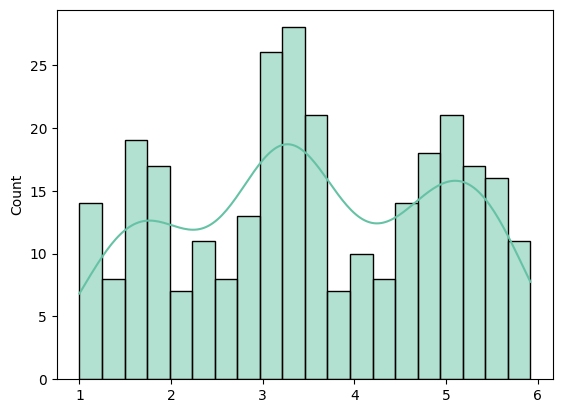

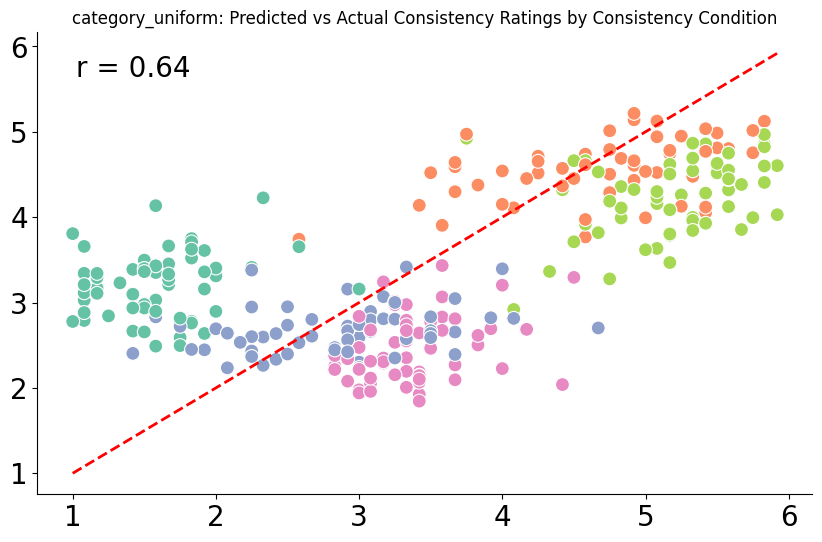

category uniform 36
(295,) (295, 10)


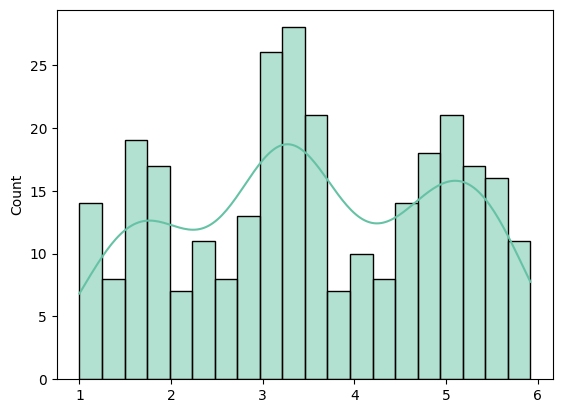

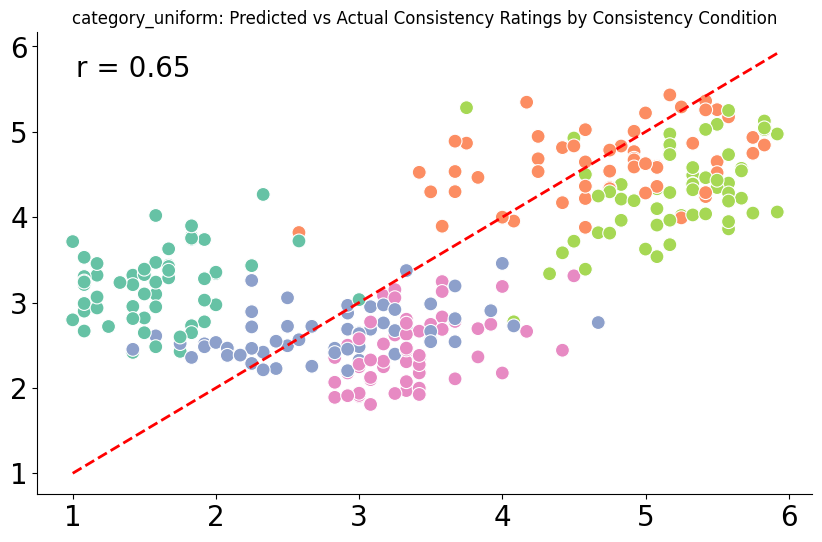

category uniform 37
(295,) (295, 10)


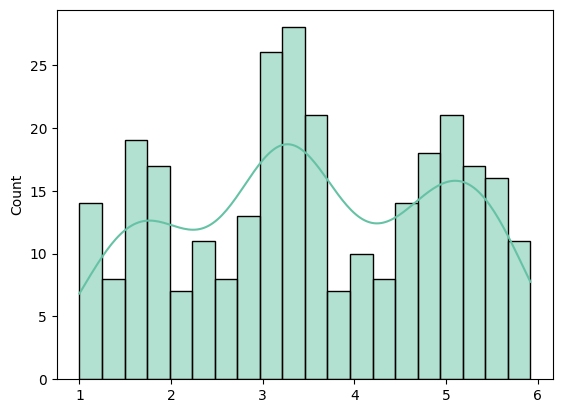

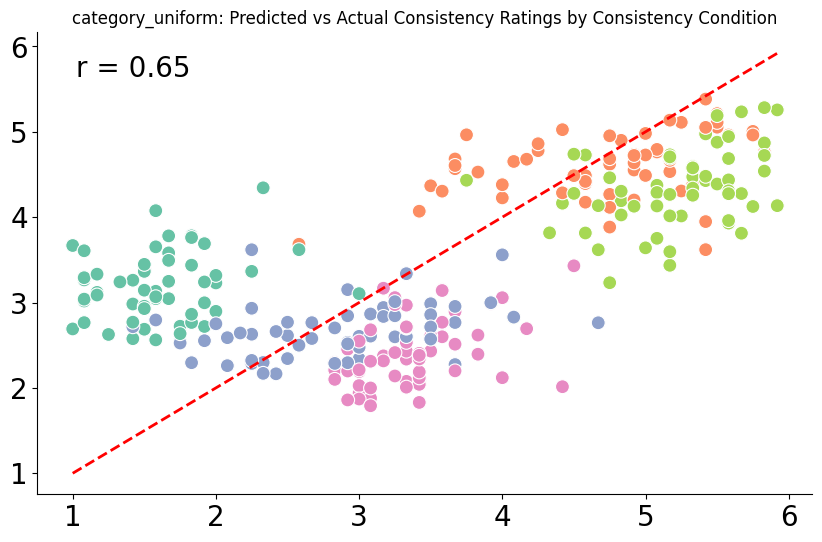

category uniform 38
(295,) (295, 10)


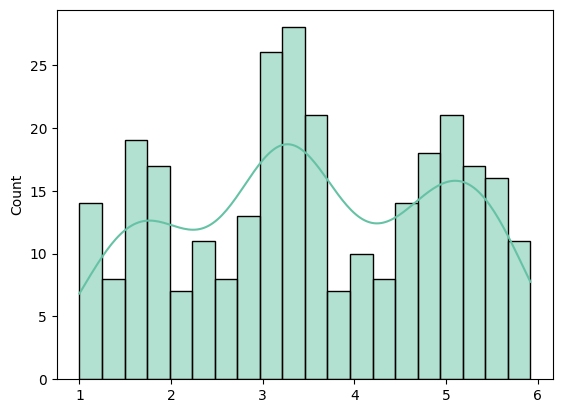

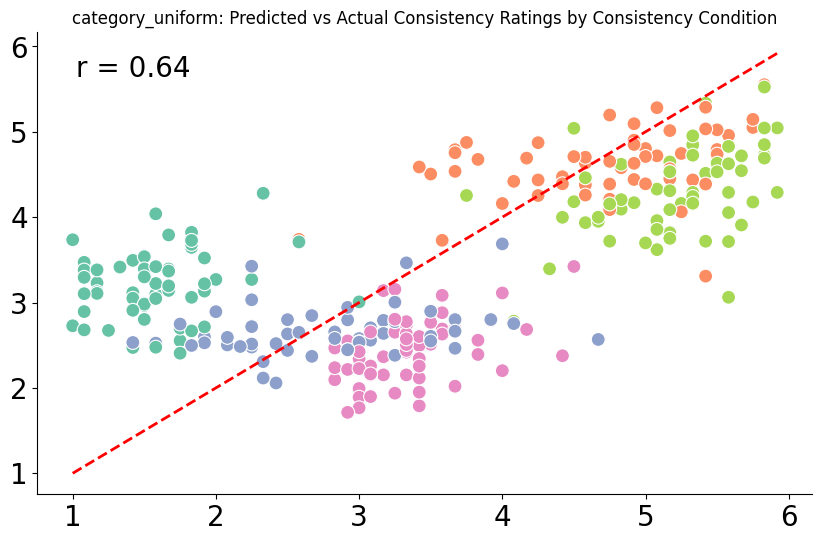

category uniform 39
(295,) (295, 10)


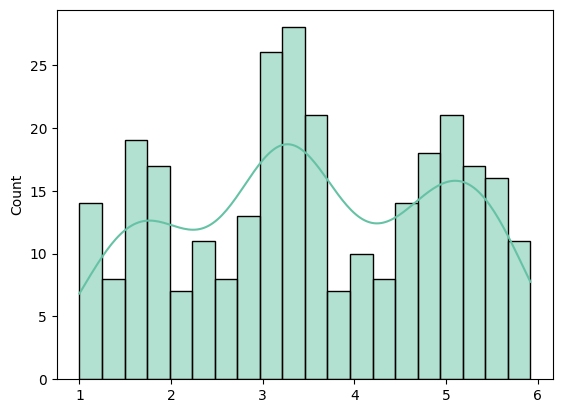

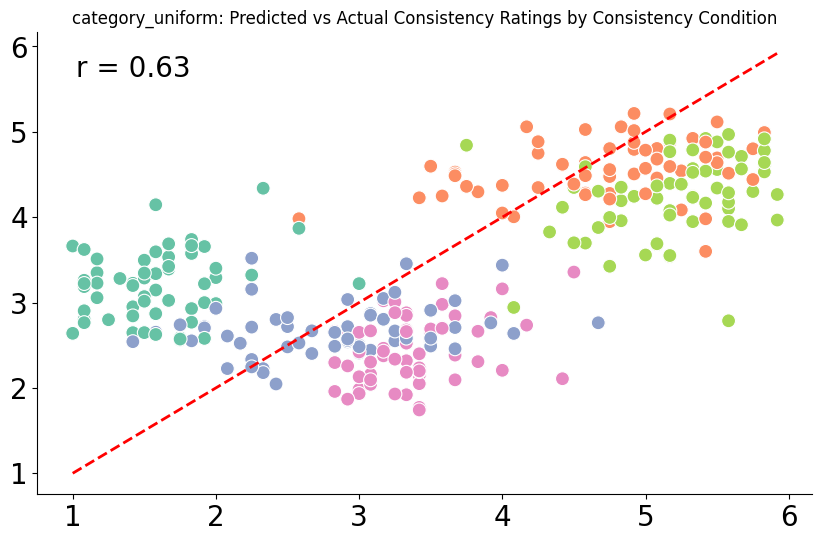

category uniform 40
(295,) (295, 10)


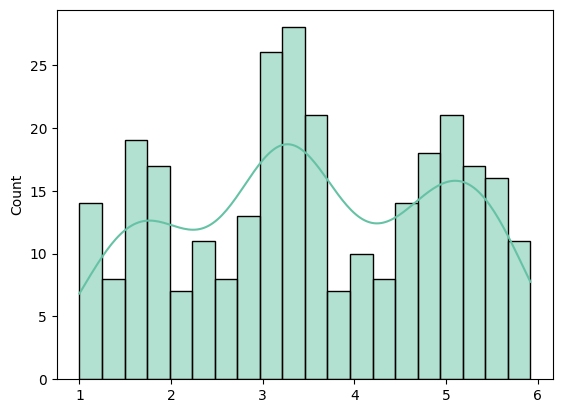

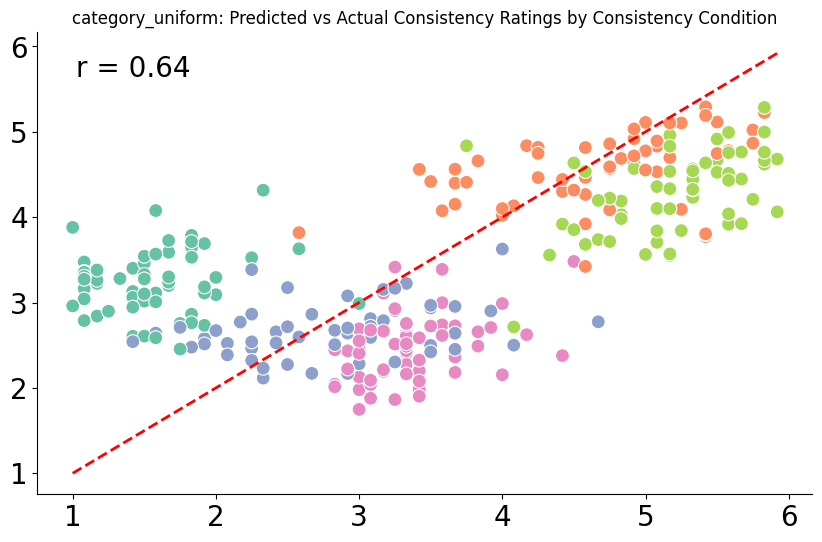

category uniform 41
(295,) (295, 10)


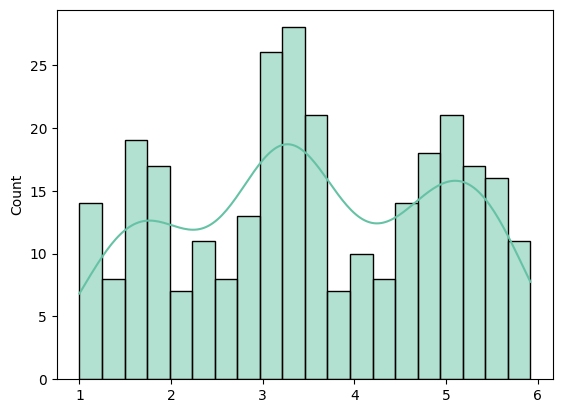

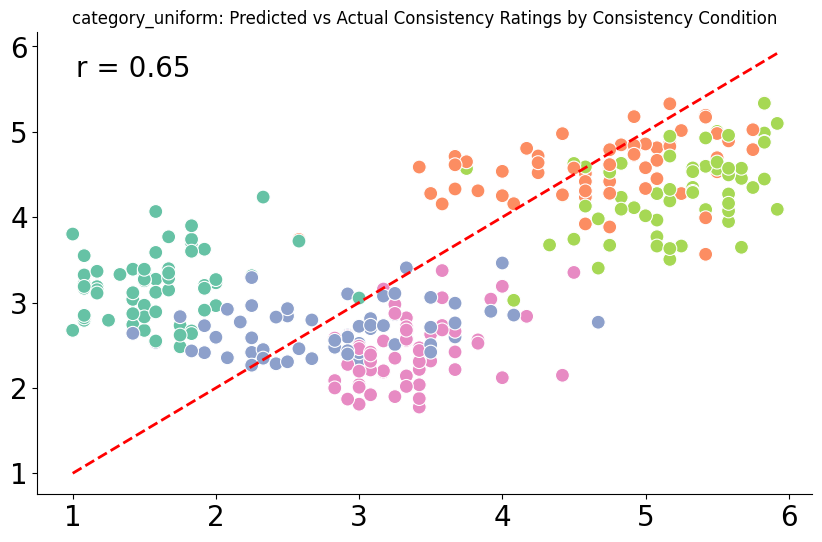

category uniform 42
(295,) (295, 10)


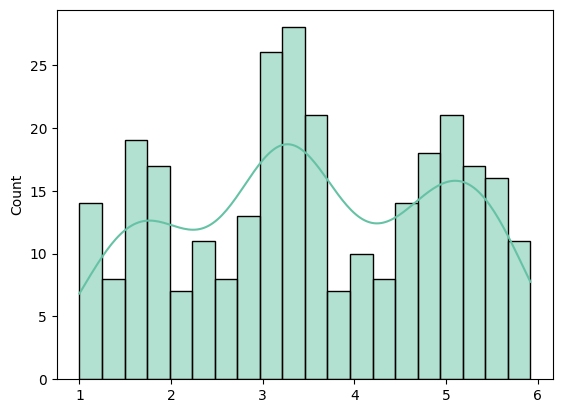

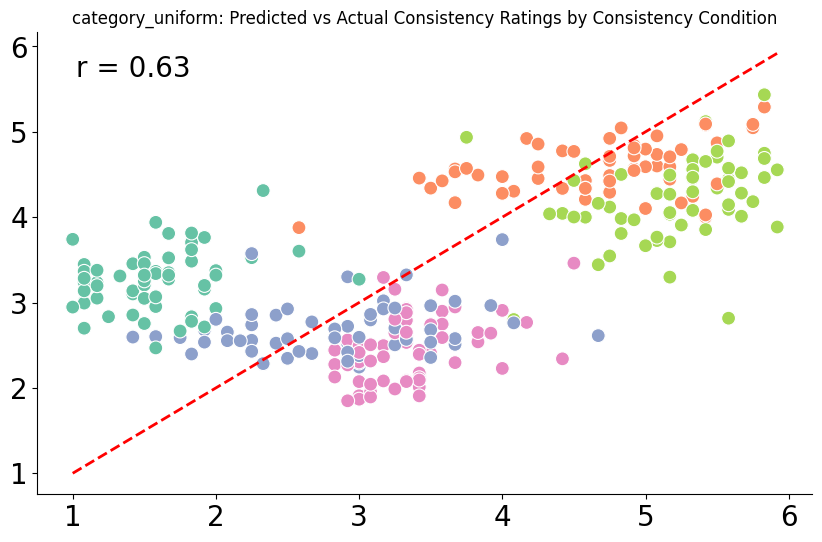

category uniform 43
(295,) (295, 10)


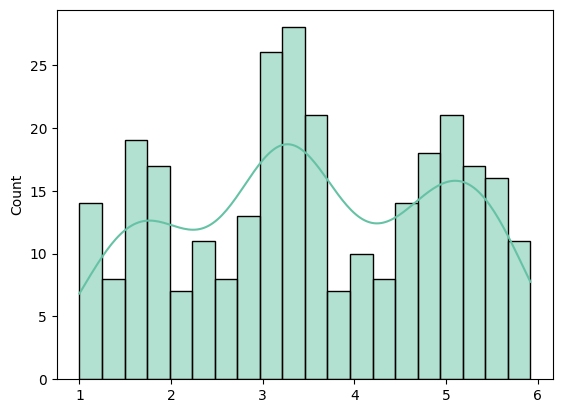

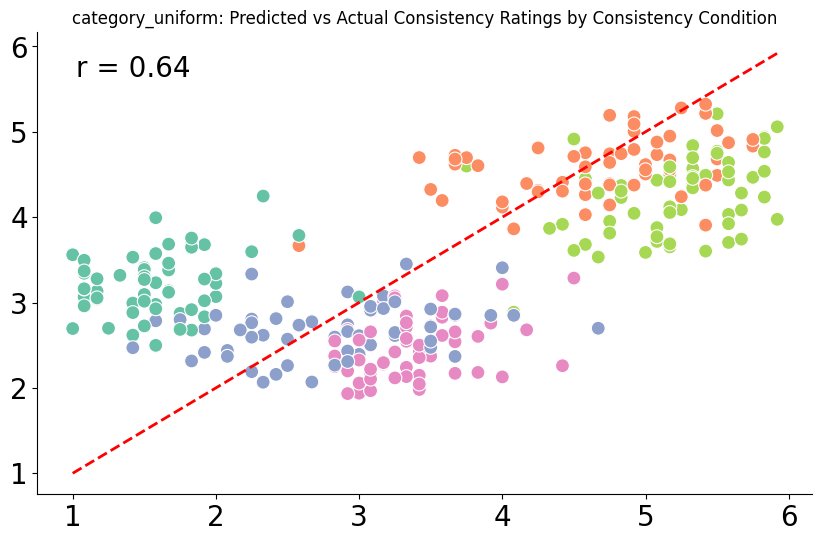

category uniform 44
(295,) (295, 10)


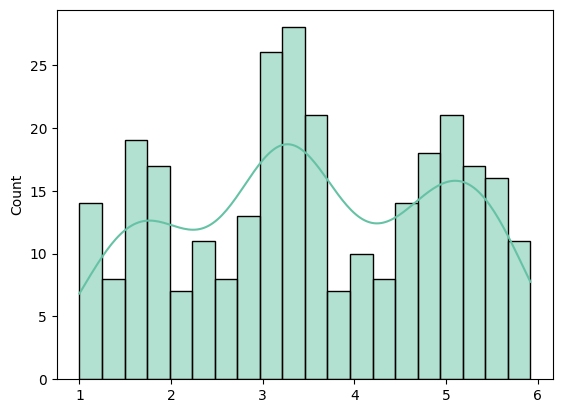

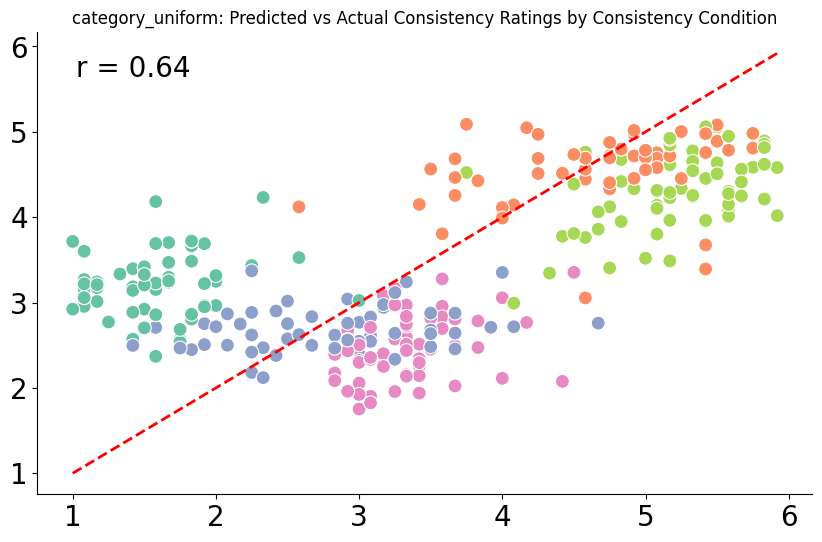

category uniform 45
(295,) (295, 10)


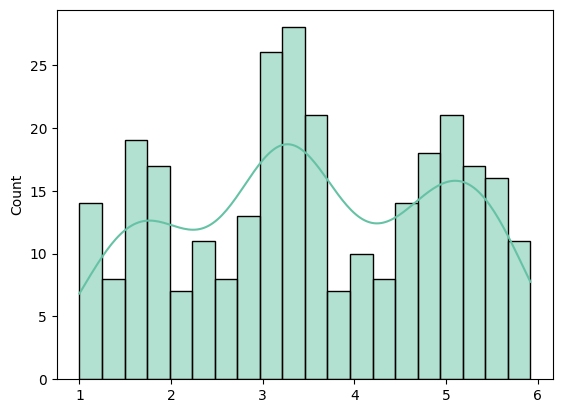

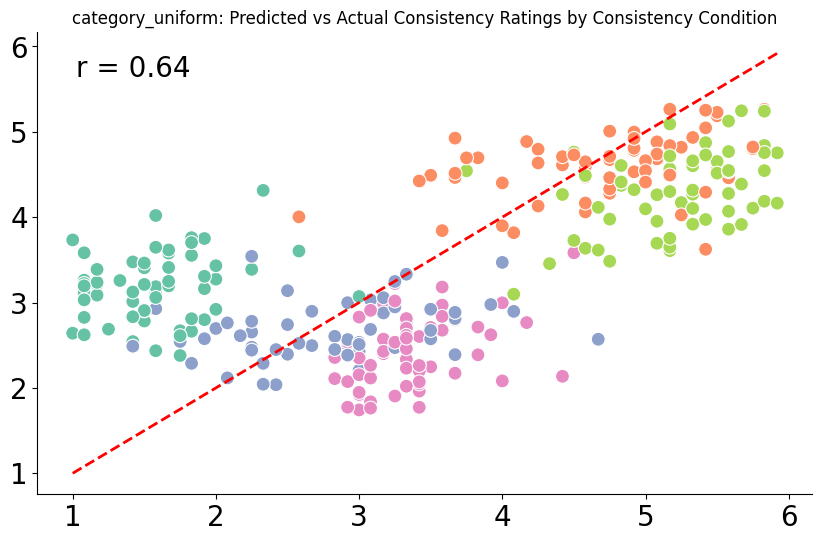

category uniform 46
(295,) (295, 10)


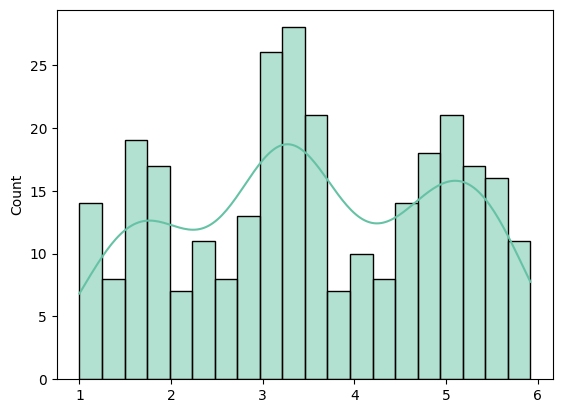

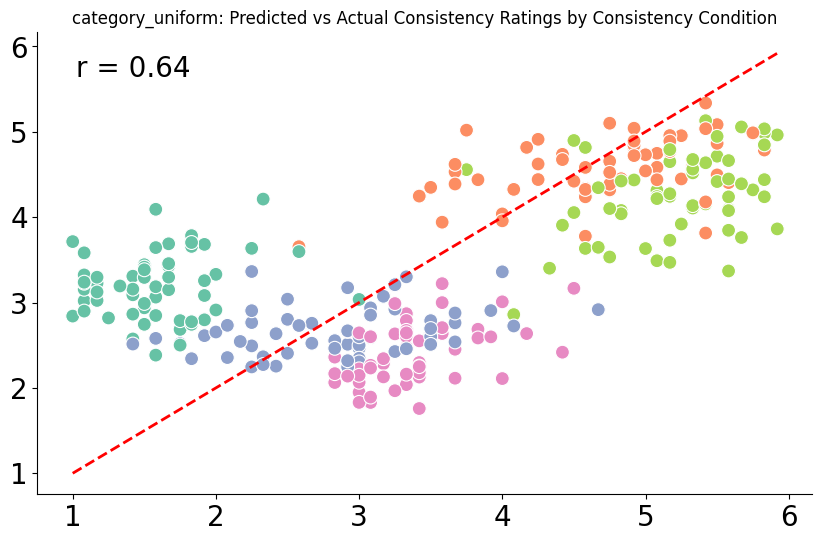

category uniform 47
(295,) (295, 10)


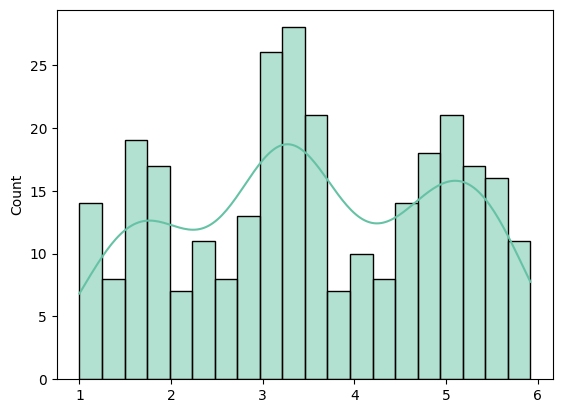

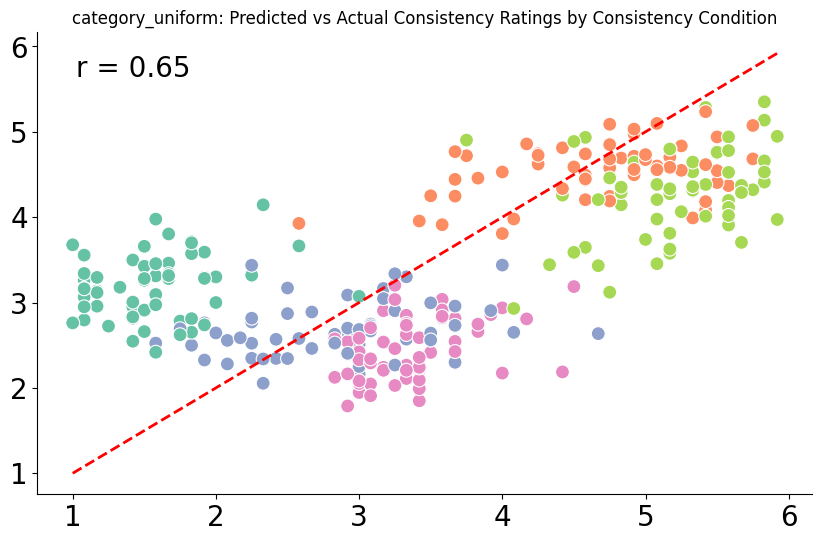

category uniform 48
(295,) (295, 10)


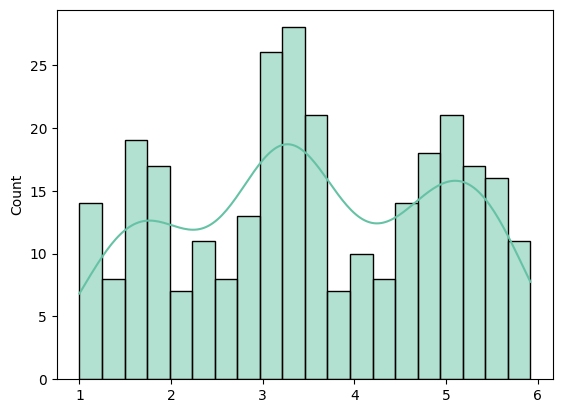

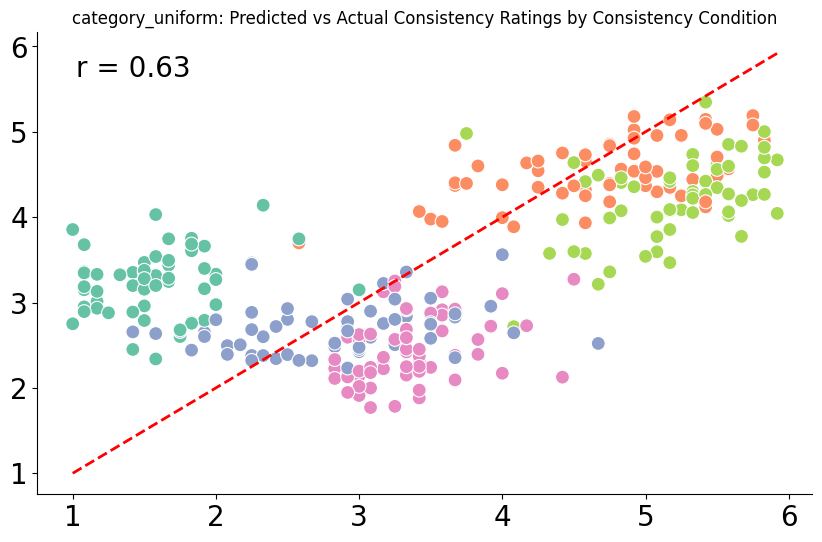

category uniform 49
(295,) (295, 10)


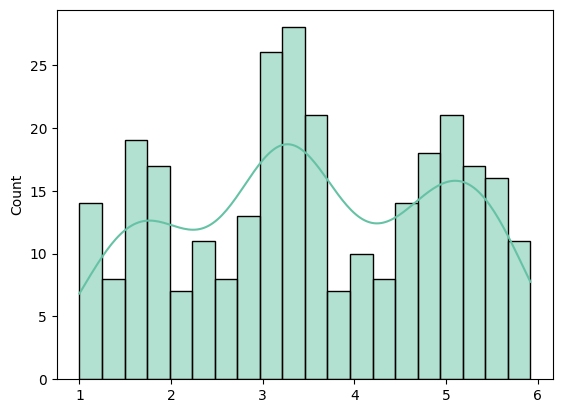

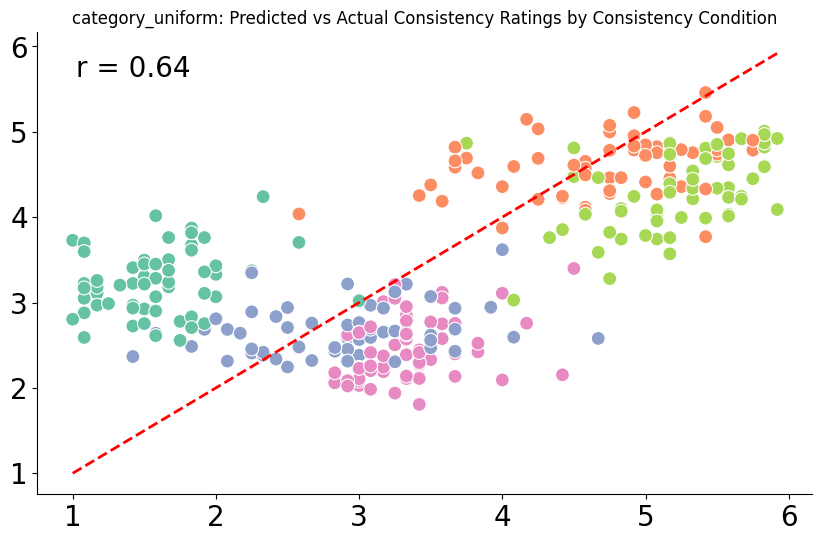

In [42]:
# erst binary versionen dann outlier true für alle versionen dann node für binary version gucken

configs = {
    0: (['category'], ['uniform']),
}

res_all = []
N_RUNS = 50
node_rep = False

binary = False
anchor_weighted = False
combined = False

remove_outliers = False
HIDDEN_CHANNELS = 10
EPOCH = "FINAL"

for run in range(0,N_RUNS):
    for i, (node, edge) in configs.items():
        df = load_scegram_data().reset_index()
        node_string = '_'.join(node)
        edge_string = '_'.join(edge)
        print(node_string, edge_string, run)
        out_string = f'h{HIDDEN_CHANNELS}_mod{MOD}_lr{LR}_bs{BATCH_SIZE}_stimsetADEK20K_edge-{edge_string}_node-{node_string}_binary-{binary}_weighted-{anchor_weighted}_{run}'

        embeds, outliers = load_embed_data(CONDITIONS, out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)

        if combined and not remove_outliers:
            out_string = f'h{HIDDEN_CHANNELS}_mod{MOD}_lr{LR}_bs{BATCH_SIZE}_stimsetADEK20K_edge-{edge_string}_node-{node_string}_binary-{False}_weighted-{False}_{run}'
            embeds_complete, outliers = load_embed_data(CONDITIONS, out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)
            out_string = f'h{HIDDEN_CHANNELS}_mod{MOD}_lr{LR}_bs{BATCH_SIZE}_stimsetADEK20K_edge-{edge_string}_node-{node_string}_binary-{True}_weighted-{True}_{run}'
            embeds_weighted, outliers = load_embed_data(CONDITIONS, out_string, TRAINSET, EPOCH, node=node_rep, remove_outliers=remove_outliers)
        
            y_pred_complete, y_actual_complete, conditions_complete, img_id_list = run_model(RandomForestRegressor(max_depth=50, max_features=None), embeds_complete, df, y_col='consistency_rating', oversample=None)
            y_pred_weighted, y_actual_weighted, conditions_weighted, img_id_list = run_model(RandomForestRegressor(max_depth=50, max_features=None), embeds_weighted, df, y_col='consistency_rating', oversample=None)
            
            y_pred_complete_weighted = []
            y_pred_weighted_weighted = []
            for p, c in zip(y_pred_complete, conditions_complete):
                if c in ["SEM"]:
                    y_pred_complete_weighted.append(p*0.9)
                elif c in ["CON", "EXSEMSYN"]:
                    y_pred_complete_weighted.append(p*0.5)
                else:
                    y_pred_complete_weighted.append(p*0.1)
            for p, c in zip(y_pred_weighted, conditions_weighted):
                if c in ["SYN", "EXSYN"]:
                    y_pred_weighted_weighted.append(p*0.9)
                elif c in ["CON", "EXSEMSYN"]:
                    y_pred_weighted_weighted.append(p*0.5)
                else:
                    y_pred_weighted_weighted.append(p*0.1)
            
            y_pred = (np.array(y_pred_complete_weighted) + np.array(y_pred_weighted_weighted))

        else:
            if remove_outliers:
                df = remove_outliers_from_df(df, CONDITIONS, outliers)
            y_pred, y_actual, conditions, img_id_list = run_model(RandomForestRegressor(max_depth=50, max_features=None), embeds, df, y_col='consistency_rating', oversample=None)
        
        # plot predicted vs actual
        plot_predicted_vs_actual(node_string+"_"+edge_string, y_pred, y_actual, conditions)

        # create dataframe for predicted and actual ratings
        df_pred = pd.DataFrame({
            'Run': [run] * len(y_pred),
            'Img_ID': img_id_list,
            'Predicted Rating': y_pred,
            'Actual Rating': y_actual,
            'Consistency Condition': conditions,
            'Node Features': node_string,
            'Edge Features': edge_string
        })
        res_all.append(df_pred)
res_df = pd.concat(res_all)

In [45]:
res_df
# res_df angucken und old_df angucken

,Run,Img_ID,Predicted Rating,Actual Rating,Consistency Condition,Node Features,Edge Features
0,0,040_EXSEMSYN,3.467360,5.58,EXSEMSYN,uniform,uniform
1,0,040_SYN,3.553481,1.92,SYN,uniform,uniform
2,0,028_SEM,3.482914,4.75,SEM,uniform,uniform
3,0,026_SEM,3.609034,4.25,SEM,uniform,uniform
4,0,028_EXSEMSYN,3.548867,4.83,EXSEMSYN,uniform,uniform
...,...,...,...,...,...,...,...
290,49,013_EXSYN,2.022427,2.92,EXSYN,category,uniform
291,49,015_SEM,5.076342,4.75,SEM,category,uniform
292,49,050_SEM,4.495150,4.58,SEM,category,uniform
293,49,037_EXSEMSYN,4.462842,4.67,EXSEMSYN,category,uniform


In [ ]:
# save to csv
# BOW model
res_df['graph_type'] = 'completeBOW'
configs_string = f'BOW_node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}'
res_df.to_csv(f'../results/regression_results/SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_{configs_string}.csv', index=False)
#the others
#if combined:
#    configs_string = f'node-{node_rep}_combined'
#else:
#    configs_string = f'node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}'


In [44]:
configs_string = f'node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}'
old_df = pd.read_csv(f'../results/regression_results/SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_{configs_string}.csv')
res_df = pd.concat([old_df, res_df])

In [ ]:
# vielleicht neue spalte für mod 
#res_df[]

In [ ]:
res_df.to_csv(f'../results/regression_results/SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_{configs_string}.csv', index=False)

### Plot

combine all

In [ ]:
# read in dfs and combine
configs_string = f'node-{False}_binary-{False}_weighted-{False}_removeoutliers-{False}'
res_1 = pd.read_csv(f'../results/regression_results/SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_{configs_string}.csv')
res_1['representation_level'] = "graph"
res_1['graph_type'] = 'complete'

configs_string = f'node-{False}_binary-{True}_weighted-{False}_removeoutliers-{False}'
res_2 = pd.read_csv(f'../results/regression_results/SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_{configs_string}.csv')
res_2['representation_level'] = "graph"
res_2['graph_type'] = 'binary'

res_df = pd.concat([res_1, res_2])

# remove node features word_embedding
res_df = res_df[res_df['Node Features'] != 'word_embedding']
res_df.head()

In [ ]:
res_df.to_csv(f'../results/regression_results/SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_gnn_all.csv', index=False)

In [ ]:
# plot true vs. predicted ratings averaged over runs

res_df = pd.read_csv(f'../results/regression_results/SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_gnn_all.csv')

sns.set_palette('Set2')
grouped_df = res_df.groupby(['Img_ID', 'Node Features', 'Edge Features', 'Consistency Condition', 'representation_level', 'graph_type']).agg({
    'Predicted Rating': 'mean',
    'Actual Rating': 'mean'
}).reset_index()



##### Per condition

In [ ]:
# plot boxplot per condition
rep_level = 'graph'
graph_type = 'complete'
# filter for specific representation level and graph type
df = res_df[(res_df['representation_level'] == rep_level) & (res_df['graph_type'] == graph_type)]

plot_avg_predicted_ratings(df)

Per condition difference scores

In [ ]:
pivot_df = res_df.pivot_table(index=['Img_ID', 'Node Features', 'Edge Features', 'Consistency Condition', 'representation_level'], columns=['graph_type'], values='Predicted Rating').reset_index()

# Compute the differences
pivot_df['complete-binary'] = pivot_df['binary'] - pivot_df['complete']
pivot_df['complete-weighted'] = pivot_df['weighted'] - pivot_df['complete']
pivot_df['binary-weighted'] = pivot_df['binary'] - pivot_df['weighted']

# Display the new DataFrame with differences
pivot_df.head()

In [ ]:
# select difference type
diff_type = 'complete-binary'

# Group the dataframe by the necessary columns
group_cols = ['Consistency Condition', 'Node Features', 'Edge Features', 'Img_ID', 'representation_level']
df_avg = pivot_df.groupby(group_cols)[diff_type].mean().reset_index()

# Get unique combinations of node/edge features
unique_cols = ['Node Features', 'Edge Features', 'representation_level']
unique_combinations = df_avg[unique_cols].drop_duplicates()

# Loop through each unique combination and create a boxplot
for _, row in unique_combinations.iterrows():
    filter_condition = (df_avg['Node Features'] == row['Node Features']) & (df_avg['Edge Features'] == row['Edge Features']) & (df_avg['representation_level'] == row['representation_level'])
    plot_title = f"{diff_type} Node: {row['Node Features']}, Edge: {row['Edge Features']} level: {row['representation_level']}"

    # Filter the data for this combination
    df_combination = df_avg[filter_condition]

    # Create the plot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Consistency Condition', y=diff_type, data=df_combination, order=CONDITIONS)
    # Overlay the individual data points using stripplot
    sns.stripplot(x='Consistency Condition', y=diff_type, data=df_combination, order=CONDITIONS,
                color='black', alpha=0.5, jitter=True, zorder=2)

    # Calculate the mean for each consistency category
    means = df_combination.groupby('Consistency Condition')[diff_type].mean()

    # Overlay the mean as a red big diamond using the correct category positions
    for i, mean in enumerate(means):
        plt.scatter(x=means.index[i], y=mean, color='red', marker="D", s=100, label='Mean' if i == 0 else "", zorder=3)
        
    add_plot_settings()
    # add horizontal line at 0
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(plot_title)

    plt.ylim(-4, 3)
    plt.show()

#### Prediction Accuracy over runs for each configuration

In [ ]:
plot_prediction_accuracy(res_df)

# Correlation embeddings ratings diff

In [ ]:
res_all = []
N_RUNS = 50
node_rep = False

binary = False
anchor_weighted = False
combined = False

remove_outliers = False

abs_diff = True

con_sem_diff_ratings, con_syn_diff_ratings, con_exsyn_diff_ratings, con_exsemsyn_diff_ratings = get_ratings_diff(abs_diff=abs_diff)

configs= {
    #0: (['uniform'], ['distance_angle']),
    #1: (['category'], ['distance_angle']),
    2: (['category'], ['uniform']),
    3: (['uniform'], ['uniform']),
}

for run in range(0,N_RUNS):
    for i, (node, edge) in configs.items():
        df = load_scegram_data().reset_index()
        node_string = '_'.join(node)
        edge_string = '_'.join(edge)
        #node_string = "category"
        #edge_string = "distance_angle"
        out_string = f'h{HIDDEN_CHANNELS}_mod{MOD}_lr{LR}_bs{BATCH_SIZE}_stimsetADEK20K_edge-{edge_string}_node-{node_string}_binary-{binary}_weighted-{anchor_weighted}_{run}'

        embeds_pca = get_good_dims(out_string, node_rep, remove_outliers, con_sem_diff_ratings, con_syn_diff_ratings, con_exsyn_diff_ratings, con_exsemsyn_diff_ratings, type="pca", abs_diff=abs_diff)
        comparisons = ['Consistent - Semantic', 'Consistent - Syntactic', 'Consistent - Extreme Syntactic', 'Consistent - Extreme Semantic + Syntactic']
        
        for e, r in zip(range(4), [con_sem_diff_ratings, con_syn_diff_ratings, con_exsyn_diff_ratings, con_exsemsyn_diff_ratings]):
            corr = spearmanr(embeds_pca[:, e], r)[0]
            df_pred = pd.DataFrame({
                'Run': [run],
                'Comparison': comparisons[e],
                'Node Features': node_string,
                'Edge Features': edge_string,
                'Correlation': corr
            })
            res_all.append(df_pred)

res_df_diff_corr = pd.concat(res_all)

In [ ]:
configs_string = f'node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}_absdiff-{abs_diff}'

In [ ]:
res_df_diff_corr.to_csv(f'../results/correlation_results/SCEGRAM_difference_correlation_runs-{N_RUNS}_{configs_string}.csv', index=False)

In [ ]:
# combine configs
N_RUNS = 50
node_rep = False
binary = False
remove_outliers = False
abs_diff = True

configs_string = f'node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}_absdiff-{abs_diff}'

res_df_1 = pd.read_csv(f'../results/correlation_results/SCEGRAM_difference_correlation_runs-{N_RUNS}_{configs_string}.csv')
res_df_1["representation_level"] = "graph"
res_df_1["graph_type"] = "complete"

binary = True
configs_string = f'node-{node_rep}_binary-{binary}_weighted-{anchor_weighted}_removeoutliers-{remove_outliers}_absdiff-{abs_diff}'
res_df_2 = pd.read_csv(f'../results/correlation_results/SCEGRAM_difference_correlation_runs-{N_RUNS}_{configs_string}.csv')
res_df_2["representation_level"] = "graph"
res_df_2["graph_type"] = "binary"

res_df = pd.concat([res_df_1, res_df_2])
res_df.to_csv(f'../results/correlation_results/SCEGRAM_difference_correlation_runs-{N_RUNS}_absdiff-{abs_diff}_all.csv', index=False) 

In [59]:
# Group the dataframe by the necessary columns
# replace NaN with 0
# filter config
graph_type = "binary"
node_feat = "category"
edge_feat = "distance_angle"
abs_diff = True

res_df_all = pd.read_csv(f'../results/correlation_results/SCEGRAM_difference_correlation_runs-{N_RUNS}_absdiff-{abs_diff}_all.csv')

df = res_df_all[(res_df_all['Node Features'] == node_feat) & (res_df_all['Edge Features'] == edge_feat) & 
                (res_df_all['graph_type'] == graph_type)]
df["Configuration"] = df["Node Features"] + "_" + df["Edge Features"]
# average over runs
df_avg = df.groupby(['Configuration', 'Run', 'Comparison'])['Correlation'].mean().reset_index()
# fill NaN with 0
df_avg = df_avg.fillna(0)
df_avg

/var/folders/8j/h8w6skpx111fc1wp64yw19kw0000gn/T/ipykernel_1697/496597465.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Configuration"] = df["Node Features"] + "_" + df["Edge Features"]


,Configuration,Run,Comparison,Correlation
0,category_distance_angle,0,Consistent - Extreme Semantic + Syntactic,-0.189443
1,category_distance_angle,0,Consistent - Extreme Syntactic,-0.064304
2,category_distance_angle,0,Consistent - Semantic,-0.108463
3,category_distance_angle,0,Consistent - Syntactic,0.094884
4,category_distance_angle,1,Consistent - Extreme Semantic + Syntactic,-0.108905
...,...,...,...,...
195,category_distance_angle,48,Consistent - Syntactic,0.057328
196,category_distance_angle,49,Consistent - Extreme Semantic + Syntactic,-0.207720
197,category_distance_angle,49,Consistent - Extreme Syntactic,-0.088421
198,category_distance_angle,49,Consistent - Semantic,0.031495


In [60]:
results = []
comparisons = ["Consistent - Semantic", "Consistent - Syntactic", "Consistent - Extreme Syntactic", "Consistent - Extreme Semantic + Syntactic"]
for condition in comparisons:
    accuracy_data = df_avg[df_avg['Comparison'] == condition]['Correlation'].values
    # remove chance level from accuracy
    diff = accuracy_data

    # compute 95% confidence interval
    deg = len(accuracy_data) - 1
    confidence_level = 0.95
    alpha = 1 - confidence_level
    critical_t = stats.t.ppf(1 - alpha/2, deg)
    std_err = np.std(accuracy_data, ddof=1) / np.sqrt(len(accuracy_data))
    confidence_interval = critical_t * std_err
    ci_lower = np.mean(accuracy_data) - confidence_interval
    ci_upper = np.mean(accuracy_data) + confidence_interval
  
    # Perform Bayesian t-test
    b_stats = pg.ttest(x=diff, y=0, alternative='greater', confidence=0.95)
    b_stats['Comparison'] = condition
    b_stats['CI_lower'] = ci_lower
    b_stats['CI_upper'] = ci_upper
    b_stats['mean'] = np.mean(accuracy_data)

    results.append(b_stats)

# Combine all results into a single DataFrame for easier viewing
bayes_results_df = pd.concat(results).reset_index(drop=True)
bf_dict = dict(zip(bayes_results_df["Comparison"], bayes_results_df["BF10"]))
bf_dict = {condition: float(bf_dict[condition]) for condition in comparisons}
bayes_results_df

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power,Comparison,CI_lower,CI_upper,mean
0,-5.339340,49,greater,0.999999,"[-0.08, inf]",0.755097,6.902e-05,2.369993e-12,Consistent - Semantic,-0.080369,-0.036415,-0.058392
1,2.937034,49,greater,0.002519,"[0.01, inf]",0.415359,13.615,8.945772e-01,Consistent - Syntactic,0.010617,0.056628,0.033623
2,-6.739952,49,greater,1.000000,"[-0.1, inf]",0.953173,6.491e-07,0.000000e+00,Consistent - Extreme Syntactic,-0.101641,-0.054952,-0.078297
3,-11.941839,49,greater,1.000000,"[-0.18, inf]",1.688831,3.201e-14,0.000000e+00,Consistent - Extreme Semantic + Syntactic,-0.181152,-0.128965,-0.155058


[1.984, 0.197, 1.731e-05, 8.757e-10]


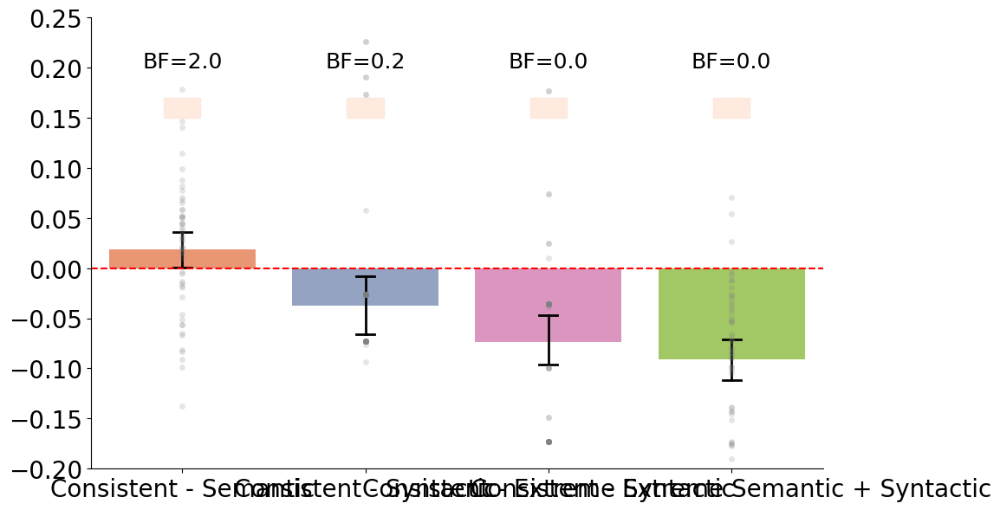

In [58]:
palette = sns.color_palette("Set2")[1:]

plot_accuracy_per_condition(df_avg, bfs=bf_dict, conditions_order=comparisons, x='Comparison', y='Correlation', chance=0, ylim=(-0.2,0.25), connect_means=False,
                            palette=palette, stripplot=True)

## Run DNN embeds

In [ ]:
dnn_embeds = load_dnn_embeds(dnn_layers, archname)
dnn_embeds = preproc_dnn_embeds(dnn_embeds)
N_RUNS = 1
res_all = []
for run in range(N_RUNS):
    for layer, embeds in dnn_embeds.items():

        # Get predictions, actuals, and conditions
        y_pred, y_actual, conditions, img_id_list = run_model(RandomForestRegressor(max_depth=50, max_features=None), embeds, df, y_col='consistency_rating', oversample=False)

        # plot predicted vs actual
        plot_predicted_vs_actual(f"{layer}", y_pred, y_actual, conditions)

        # create dataframe for predicted and actual ratings
        df_pred = pd.DataFrame({
            'Run': [run] * len(y_pred),
            'Img_ID': img_id_list,
            'Predicted Rating': y_pred,
            'Actual Rating': y_actual,
            'Consistency Condition': conditions,
            'Layer': layer,
            'Archname': archname
        })
        res_all.append(df_pred)
res_df = pd.concat(res_all)

In [ ]:
# save to csv
res_df.to_csv(f'../results/regression_results/{archname}-SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_oversample.csv', index=False)

### Plot

In [ ]:
# plot
res_df = pd.read_csv(f'../results/regression_results/{archname}-SCEGRAM_randomforest_regression_results_runs-{1}_oversample.csv')
# remove columns layer and archname
#res_df = res_df.drop(columns=['Layer', 'Archname'])
# add columns node and edge
#res_df['Node Features'] = 'semantic_segmentation'
#res_df['Edge Features'] = 'semantic_segmentation'
#res_df

In [ ]:
# plot boxplot per condition
plot_avg_predicted_ratings(res_df, dnn=True)

## Plot all

In [49]:
res_df_all = pd.read_csv(f'../results/regression_results/SCEGRAM_randomforest_regression_results_runs-{N_RUNS}_gnn_all.csv')

# print unique combinations
res_df_all[['Node Features', 'Edge Features', 'graph_type', 'representation_level']].drop_duplicates()

,Node Features,Edge Features,graph_type,representation_level
0,uniform,uniform,complete,graph
295,category,uniform,complete,graph
29500,category,distance_angle,binary,graph
44250,uniform,distance_angle,binary,graph


In [50]:
res_df_all

,Run,Img_ID,Predicted Rating,Actual Rating,Consistency Condition,Node Features,Edge Features,representation_level,graph_type
0,0,040_EXSEMSYN,3.467360,5.58,EXSEMSYN,uniform,uniform,graph,complete
1,0,040_SYN,3.553481,1.92,SYN,uniform,uniform,graph,complete
2,0,028_SEM,3.482914,4.75,SEM,uniform,uniform,graph,complete
3,0,026_SEM,3.609034,4.25,SEM,uniform,uniform,graph,complete
4,0,028_EXSEMSYN,3.548867,4.83,EXSEMSYN,uniform,uniform,graph,complete
...,...,...,...,...,...,...,...,...,...
58995,49,013_EXSYN,3.310574,2.92,EXSYN,uniform,distance_angle,graph,binary
58996,49,015_SEM,3.571285,4.75,SEM,uniform,distance_angle,graph,binary
58997,49,050_SEM,3.365556,4.58,SEM,uniform,distance_angle,graph,binary
58998,49,037_EXSEMSYN,3.511889,4.67,EXSEMSYN,uniform,distance_angle,graph,binary


In [51]:
# filter conditions
filtered_df = res_df_all[(res_df_all['representation_level'].isin(['graph','dnn'])) & (res_df_all['graph_type'].isin(['complete', 'binary', 'dnn']))]

# filter for category distance_angle, uniform uniform
filtered_df_combination = filtered_df[((filtered_df['Node Features'] == 'category') & (filtered_df['Edge Features'] == 'distance_angle') & (filtered_df['graph_type'] == "binary")) |
                                      ((filtered_df['Node Features'] == 'category') & (filtered_df['Edge Features'] == 'uniform') & (filtered_df['graph_type'] == "complete")) |
                                      ((filtered_df['Node Features'] == 'uniform') & (filtered_df['Edge Features'] == 'distance_angle') & (filtered_df['graph_type'] == 'binary')) |
                                      ((filtered_df['Node Features'] == 'uniform') & (filtered_df['Edge Features'] == 'uniform') & (filtered_df['graph_type'] == 'complete')) |
                                      ((filtered_df['Node Features'] == 'semantic_segmentation'))]



In [52]:
filtered_df_combination['Configuration'] = filtered_df_combination['Node Features'] + "_" + filtered_df_combination['Edge Features'].astype(str) + "_" + filtered_df_combination['representation_level'] + "_" + filtered_df_combination['graph_type']

# Compute correlations
correlation_df = compute_correlations(filtered_df_combination)

In [53]:
unique_configs = correlation_df['Configuration'].unique()

# Placeholder to store results
results = []

# Loop through each configuration and test the correlations against zero
for config in unique_configs:
    if "semantic_segmentation" in config:
        continue
    # Extract correlation values for the current configuration
    correlations = correlation_df[correlation_df['Configuration'] == config]['Correlation']
    
    # compute 95% confidence interval
    deg = len(correlations) - 1
    confidence_level = 0.95
    alpha = 1 - confidence_level
    critical_t = stats.t.ppf(1 - alpha/2, deg)
    std_err = np.std(correlations, ddof=1) / np.sqrt(len(correlations))
    confidence_interval = critical_t * std_err
    ci_lower = np.mean(correlations) - confidence_interval
    ci_upper = np.mean(correlations) + confidence_interval

    # Perform a Bayesian one-sample t-test against zero
    bayes_test_result = pg.ttest(correlations, 0, paired=False, alternative='greater')

    # Extract important values
    t_stat = bayes_test_result['T'][0]
    dof = bayes_test_result['dof'][0]
    p_val = bayes_test_result['p-val'][0]
    ci_95 = bayes_test_result['CI95%'][0]
    cohen_d = bayes_test_result['cohen-d'][0]
    bf10 = bayes_test_result['BF10'][0]
    power = bayes_test_result['power'][0]

    # Append the result to the list
    results.append({
        'Configuration': config,
        'T': t_stat,
        'dof': dof,
        'p-val': p_val,
        'cohen-d': cohen_d,
        'BF10': bf10,
        'power': power,
        'CI_lower': ci_lower,
        'CI_upper': ci_upper,
        'mean': np.mean(correlations)
    })

# Convert results to a DataFrame
bayes_results_df = pd.DataFrame(results)

# Display results in a neat format
bayes_results_df[['Configuration', 'T', 'dof', 'p-val', 'cohen-d', 'BF10', 'power', 'CI_lower', 'CI_upper', 'mean']]

# BF dictionalry
bf_dict = dict(zip(bayes_results_df["Configuration"], bayes_results_df["BF10"]))
bf_dict = {condition: float(bf_dict[condition]) for condition in unique_configs if "semantic_segmentation" not in condition}
bf_dict

/Users/aylinkallmayer/anaconda3/envs/comp_sce_gram/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: divide by zero encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/aylinkallmayer/anaconda3/envs/comp_sce_gram/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: divide by zero encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/aylinkallmayer/anaconda3/envs/comp_sce_gram/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: divide by zero encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)


{'category_distance_angle_graph_binary': 0.0,
 'category_uniform_graph_complete': 3.242e+91,
 'uniform_distance_angle_graph_binary': 2.756e-46,
 'uniform_uniform_graph_complete': 2.854e-50}

In [54]:
bayes_results_df

,Configuration,T,dof,p-val,cohen-d,BF10,power,CI_lower,CI_upper,mean
0,category_distance_angle_graph_binary,-5.129357,49,9.999975e-01,0.725401,0.0,1.000944e-11,-0.064576,-0.028220,-0.046398
1,category_uniform_graph_complete,784.625099,49,2.109223e-102,110.962746,3.242e+91,1.000000e+00,0.600293,0.603376,0.601834
2,uniform_distance_angle_graph_binary,-64.250915,49,1.000000e+00,9.086452,2.756e-46,0.000000e+00,-0.422618,-0.396983,-0.409801
3,uniform_uniform_graph_complete,-77.934558,49,1.000000e+00,11.021611,2.854e-50,0.000000e+00,-0.421660,-0.400461,-0.411061


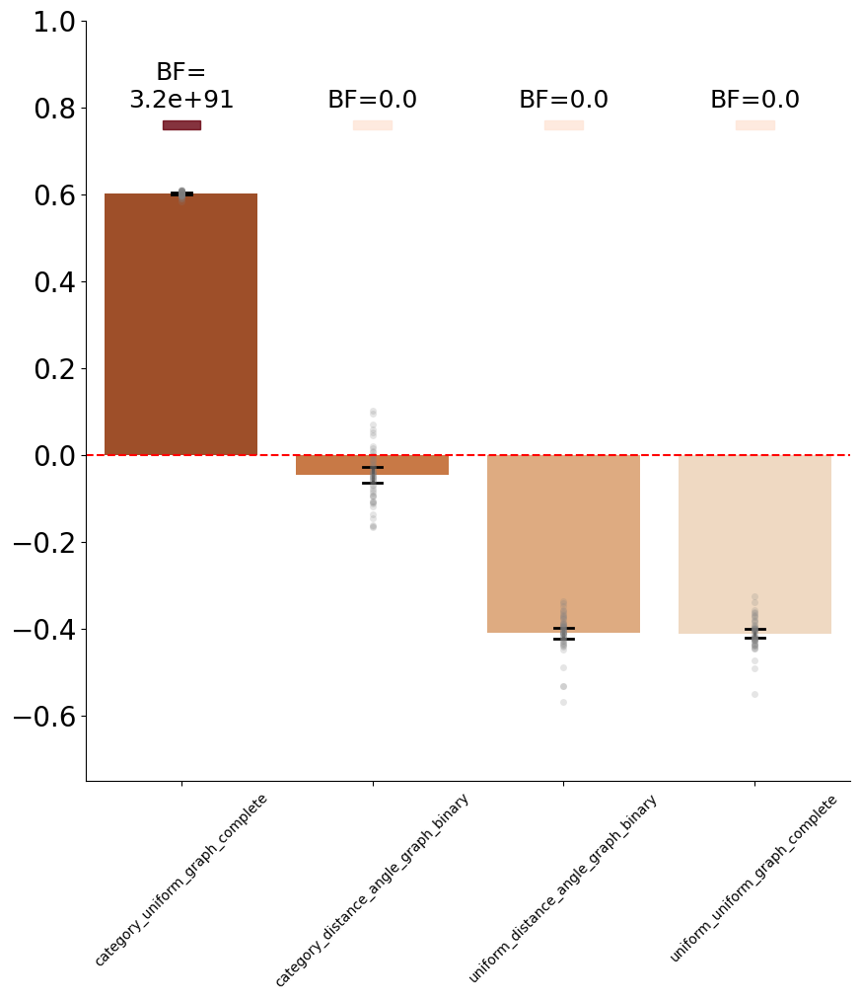

In [55]:
plot_prediction_accuracy(correlation_df, bfs=bf_dict, figsize=(10, 10))

---